In [2]:
!pip3 install "pymongo<4.0"

In [3]:
import pymongo as pm #import MongoClient only
client = pm.MongoClient('bigdatadb.polito.it',
ssl=True, #there might be conflicts, try to set to False
authSource = 'carsharing',
username = 'ictts',
password ='Ict4SM22!',
tlsAllowInvalidCertificates=True)

In [4]:
db = client['carsharing']

In [5]:
Bookings_collection = db['PermanentBookings']

In [6]:
pb_coll=db['PermanentBookings']

In [7]:
pb_coll.find_one()

{'_id': ObjectId('5900e8bc2ad8531539ed0847'),
 'init_fuel': 45,
 'city': 'Vancouver',
 'walking': {'duration': -1, 'distance': -1},
 'vendor': 'car2go',
 'driving': {'duration': -1, 'distance': -1},
 'final_time': 1481650748,
 'plate': '644XNS',
 'engineType': 'CE',
 'init_time': 1481650703,
 'vin': 'WMEEJ3BA8EK762841',
 'smartPhoneRequired': False,
 'interior': 'GOOD',
 'final_fuel': 45,
 'exterior': 'GOOD',
 'init_date': datetime.datetime(2016, 12, 13, 9, 38, 23),
 'final_date': datetime.datetime(2016, 12, 13, 9, 39, 8),
 'init_address': '1694 Duranleau,surface lot next t/Bridges.fits3',
 'final_address': '1694 Duranleau,surface lot next t/Bridges.fits3',
 'origin_destination': {'type': 'LineString',
  'coordinates': [[-123.13606, 49.27269], [-123.13606, 49.27269]]},
 'public_transport': {'duration': -1,
  'distance': -1,
  'arrival_date': -1,
  'arrival_time': -1}}

In [8]:
import pprint

In [9]:
pprint.pprint(Bookings_collection.find_one({"city":"Torino"}))

{'_id': ObjectId('5900e8bc2ad8531539ed0868'),
 'city': 'Torino',
 'driving': {'distance': -1, 'duration': -1},
 'engineType': 'CE',
 'exterior': 'GOOD',
 'final_address': 'Via Monte di Pietà, 34, 10122 Torino',
 'final_date': datetime.datetime(2016, 12, 13, 18, 43),
 'final_fuel': 50,
 'final_time': 1481650980,
 'init_address': 'Via Monte di Pietà, 34, 10122 Torino',
 'init_date': datetime.datetime(2016, 12, 13, 18, 40, 42),
 'init_fuel': 50,
 'init_time': 1481650842,
 'interior': 'GOOD',
 'origin_destination': {'coordinates': [[7.67936, 45.07162],
                                        [7.67936, 45.07162]],
                        'type': 'LineString'},
 'plate': '325/FF050VV',
 'public_transport': {'arrival_date': -1,
                      'arrival_time': -1,
                      'distance': -1,
                      'duration': -1},
 'smartPhoneRequired': True,
 'vendor': 'car2go',
 'vin': 'WME4533421K152585',
 'walking': {'distance': -1, 'duration': -1}}


In [10]:
list(pb_coll.find({},{
    '_id':0,
    'init_time':1,
    'final_time':1
}).limit(5))

[{'final_time': 1481650748, 'init_time': 1481650703},
 {'final_time': 1481650748, 'init_time': 1481650703},
 {'final_time': 1481650793, 'init_time': 1481650748},
 {'final_time': 1481650793, 'init_time': 1481650748},
 {'final_time': 1481650842, 'init_time': 1481650793}]

In [11]:
# شمارش تعداد اسناد در هر کالکشن برای car2go
print("ActiveBookings:", db['ActiveBookings'].count_documents({}))
print("ActiveParkings:", db['ActiveParkings'].count_documents({}))
print("PermanentBookings:", db['PermanentBookings'].count_documents({}))
print("PermanentParkings:", db['PermanentParkings'].count_documents({}))


ActiveBookings: 8743
ActiveParkings: 4790
PermanentBookings: 28180508
PermanentParkings: 28312676


In [12]:
print("enjoy_ActiveBookings:", db['enjoy_ActiveBookings'].count_documents({}))
print("enjoy_ActiveParkings:", db['enjoy_ActiveParkings'].count_documents({}))
print("enjoy_PermanentBookings:", db['enjoy_PermanentBookings'].count_documents({}))
print("enjoy_PermanentParkings:", db['enjoy_PermanentParkings'].count_documents({}))
#برای enjoy

enjoy_ActiveBookings: 0
enjoy_ActiveParkings: 0
enjoy_PermanentBookings: 6653472
enjoy_PermanentParkings: 6689979


In [13]:
db['PermanentBookings'].count_documents({"city": "Torino"})


873240

In [14]:
db['PermanentBookings'].count_documents({"city": "Milano"})


2234909

In [15]:
db = client['carsharing']
db.list_collection_names()


['enjoy_DebugInfo',
 'ictts_PermanentBookings',
 'ictts_enjoy_PermanentBookings',
 'enjoy_PermanentBookings',
 'BigDive7_PermanentBookings',
 'enjoy_ActiveParkings',
 'test_collection',
 'DebugInfo',
 'PermanentBookings',
 'PermanentParkings',
 'system.js',
 'ActiveParkings',
 'enjoy_PermanentParkings',
 'hexs_gen',
 'enjoy_ActiveBookings',
 'ActiveBookings']

In [16]:
milano_bookings = list(db['PermanentBookings'].find({"city": "Milano"}))
milano_parking = list(db['PermanentParkings'].find({"city": "Milano"}))
print("Number of bookings:", len(milano_bookings))
print("Number of parkings:", len(milano_parking))


Number of bookings: 2234909
Number of parkings: 2243994


In [17]:
import pprint
pprint.pprint(db['PermanentBookings'].find_one({"city": "Milano"}))


{'_id': ObjectId('5900e8bc2ad8531539ed0850'),
 'city': 'Milano',
 'driving': {'distance': -1, 'duration': -1},
 'engineType': 'CE',
 'exterior': 'GOOD',
 'final_address': 'Via Masolino da Panicale, 4, 20155 Milano',
 'final_date': datetime.datetime(2016, 12, 13, 18, 40, 42),
 'final_fuel': 100,
 'final_time': 1481650842,
 'init_address': 'Via Masolino da Panicale, 4, 20155 Milano',
 'init_date': datetime.datetime(2016, 12, 13, 18, 39, 53),
 'init_fuel': 100,
 'init_time': 1481650793,
 'interior': 'GOOD',
 'origin_destination': {'coordinates': [[9.15158, 45.49339],
                                        [9.15158, 45.49339]],
                        'type': 'LineString'},
 'plate': '620/FF318NT',
 'public_transport': {'arrival_date': -1,
                      'arrival_time': -1,
                      'distance': -1,
                      'duration': -1},
 'smartPhoneRequired': True,
 'vendor': 'car2go',
 'vin': 'WME4533421K145009',
 'walking': {'distance': -1, 'duration': -1}}


In [18]:
import datetime

collections = [
    "ActiveBookings", "ActiveParkings", "PermanentBookings", "PermanentParkings",
    "enjoy_ActiveBookings", "enjoy_ActiveParkings", "enjoy_PermanentBookings", "enjoy_PermanentParkings"
]

print(f"{'Collection':35} {'Start Time':25} {'End Time':25}")
print("-" * 90)

for name in collections:
    coll = db[name]
    docs = list(coll.find().sort("init_time", 1).limit(1))
    if len(docs) > 0:
        start = datetime.datetime.fromtimestamp(docs[0]["init_time"])
        end = datetime.datetime.fromtimestamp(list(coll.find().sort("init_time", -1).limit(1))[0]["init_time"])
        print(f"{name:35} {start} {end}")
    else:
        print(f"{name:35} {'No data':<25} {'No data':<25}")


Collection                          Start Time                End Time                 
------------------------------------------------------------------------------------------
ActiveBookings                      2017-12-11 13:45:38 2018-01-31 13:13:03
ActiveParkings                      2018-01-24 05:56:00 2018-01-31 13:13:03
PermanentBookings                   2016-12-13 17:38:23 2018-01-31 13:11:33
PermanentParkings                   2016-12-13 17:37:38 2018-01-31 13:11:33
enjoy_ActiveBookings                No data                   No data                  
enjoy_ActiveParkings                No data                   No data                  
enjoy_PermanentBookings             2017-05-05 15:06:21 2019-06-10 17:16:20
enjoy_PermanentParkings             2017-05-05 15:05:36 2019-06-10 17:16:20


In [19]:
# ماشین‌های Car2Go در Milano
c2g_cars = db.PermanentParkings.distinct("plate", {"city": "Milano"})

# ماشین‌های Enjoy در Milano
enjoy_cars = db.enjoy_PermanentParkings.distinct("plate", {"city": "Milano"})

# ترکیب دو سرویس (بدون تکرار پلاک‌ها)
total_cars = set(c2g_cars) | set(enjoy_cars)

# چاپ نتایج
print("Car2Go cars in Milano:", len(c2g_cars))
print("Enjoy cars in Milano:", len(enjoy_cars))
print("Total unique cars seen in Milano:", len(total_cars))


Car2Go cars in Milano: 1155
Enjoy cars in Milano: 1879
Total unique cars seen in Milano: 3034


In [20]:
# Week 1: 10–17 November 2017
start1 = 1510272000   # 2017-11-10 00:00:00 UTC
end1   = 1510876800   # 2017-11-17 00:00:00 UTC

# Week 2: 17–24 November 2017
start2 = 1510876800   # 2017-11-17 00:00:00 UTC
end2   = 1511481600   # 2017-11-24 00:00:00 UTC

# --- Car2Go (PermanentParkings) ---
c2g_week1 = set(db.PermanentParkings.distinct(
    "plate", {"city": "Milano", "init_time": {"$gte": start1, "$lt": end1}}
))
c2g_week2 = set(db.PermanentParkings.distinct(
    "plate", {"city": "Milano", "init_time": {"$gte": start2, "$lt": end2}}
))

# --- Enjoy (enjoy_PermanentParkings) ---
enjoy_week1 = set(db.enjoy_PermanentParkings.distinct(
    "plate", {"city": "Milano", "init_time": {"$gte": start1, "$lt": end1}}
))
enjoy_week2 = set(db.enjoy_PermanentParkings.distinct(
    "plate", {"city": "Milano", "init_time": {"$gte": start2, "$lt": end2}}
))

# --- نتایج ---
print("Car2Go week1:", len(c2g_week1))
print("Car2Go week2:", len(c2g_week2))
print("Enjoy week1:", len(enjoy_week1))
print("Enjoy week2:", len(enjoy_week2))
print("Total week1:", len(c2g_week1 | enjoy_week1))
print("Total week2:", len(c2g_week2 | enjoy_week2))


Car2Go week1: 797
Car2Go week2: 810
Enjoy week1: 874
Enjoy week2: 938
Total week1: 1671
Total week2: 1748


In [21]:
# بازه زمانی: 1 دسامبر 2017 تا 1 ژانویه 2018
start_time = 1512086400   # 2017-12-01 00:00:00 UTC
end_time   = 1514764800   # 2018-01-01 00:00:00 UTC

# --- رزروهای Car2Go (PermanentBookings) ---
car2go_count = db.PermanentBookings.count_documents({
    "city": "Milano",
    "init_time": {"$gte": start_time, "$lt": end_time}
})

# --- رزروهای Enjoy (enjoy_PermanentBookings) ---
enjoy_count = db.enjoy_PermanentBookings.count_documents({
    "city": "Milano",
    "init_time": {"$gte": start_time, "$lt": end_time}
})

# --- جمع دو سرویس ---
total_bookings = car2go_count + enjoy_count

print("Car2Go bookings in Milano (Dec 2017):", car2go_count)
print("Enjoy bookings in Milano (Dec 2017):", enjoy_count)
print("Total bookings in Milano (Dec 2017):", total_bookings)


Car2Go bookings in Milano (Dec 2017): 213327
Enjoy bookings in Milano (Dec 2017): 197867
Total bookings in Milano (Dec 2017): 411194


In [22]:
# حالت‌های حمل‌ونقل جایگزین
modes = ["walking", "driving", "public_transport"]

# تابع شمارش رزروها برای هر مود
def count_modes(collection_name, city):
    coll = db[collection_name]
    print(f"\n--- {collection_name} ({city}) ---")
    total = 0
    for mode in modes:
        count = coll.count_documents({
            "city": city,
            mode: {"$exists": True, "$ne": 0}
        })
        total += count
        print(f"{mode}: {count}")
    print("Total bookings with modes:", total)

# اجرای تابع برای هر دو کالکشن
count_modes("PermanentBookings", "Milano")
count_modes("enjoy_PermanentBookings", "Milano")



--- PermanentBookings (Milano) ---
walking: 2234909
driving: 2234909
public_transport: 2234909
Total bookings with modes: 6704727

--- enjoy_PermanentBookings (Milano) ---
walking: 3107260
driving: 3107260
public_transport: 3107260
Total bookings with modes: 9321780


In [23]:
import pandas as pd
import numpy as np
import datetime

# --- بازه زمانی ---
start_time = 1509494400   # 2017-11-01 00:00:00 UTC
end_time   = 1517356800   # 2018-01-31 00:00:00 UTC

# فقط فیلدهای لازم برای تحلیل
proj = {"_id": 0, "init_time": 1, "final_time": 1, "city": 1}

# --- Car2Go Bookings ---
car2go_b = list(db.PermanentBookings.find(
    {"city": "Milano", "init_time": {"$gte": start_time, "$lt": end_time}, "final_time": {"$exists": True}},
    proj
))
for doc in car2go_b:
    doc["service"] = "Car2Go"

# --- Enjoy Bookings ---
enjoy_b = list(db.enjoy_PermanentBookings.find(
    {"city": "Milano", "init_time": {"$gte": start_time, "$lt": end_time}, "final_time": {"$exists": True}},
    proj
))
for doc in enjoy_b:
    doc["service"] = "Enjoy"

# --- ترکیب دو سرویس در یک دیتافریم ---
df_b = pd.DataFrame(car2go_b + enjoy_b)

# --- محاسبه مدت رزرو (به دقیقه) ---
df_b["duration_min"] = (df_b["final_time"] - df_b["init_time"]) / 60
df_b = df_b[(df_b["duration_min"] > 0) & np.isfinite(df_b["duration_min"])]

# --- تبدیل timestamp به تاریخ واقعی ---
df_b["init_date"] = df_b["init_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))
df_b["final_date"] = df_b["final_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))

# --- نمایش خلاصه ---
print("Total bookings in Milano:", len(df_b))
print("\nBookings per service:")
print(df_b["service"].value_counts())

# نمایش چند نمونه از هر سرویس جداگانه
print("\nSample bookings from Car2Go:")
display(df_b[df_b["service"] == "Car2Go"][["service", "init_date", "final_date", "duration_min"]].head(5))

print("\nSample bookings from Enjoy:")
display(df_b[df_b["service"] == "Enjoy"][["service", "init_date", "final_date", "duration_min"]].head(5))

#استپ  دو شروع شد اول کفت تاریخ و پس من انجامش دادم 

/tmp/ipykernel_52/2283123327.py:36: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  df_b["init_date"] = df_b["init_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))
/tmp/ipykernel_52/2283123327.py:37: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  df_b["final_date"] = df_b["final_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))


Total bookings in Milano: 1172825

Bookings per service:
service
Car2Go    635434
Enjoy     537391
Name: count, dtype: int64

Sample bookings from Car2Go:


,service,init_date,final_date,duration_min
0,Car2Go,2018-01-30 23:59:25,2018-01-31 00:11:51,12.433333
1,Car2Go,2018-01-30 23:59:25,2018-01-31 00:36:59,37.566667
2,Car2Go,2018-01-30 23:57:41,2018-01-31 00:10:09,12.466667
3,Car2Go,2018-01-30 23:56:46,2018-01-31 00:32:46,36.000000
4,Car2Go,2018-01-30 23:55:52,2018-01-31 00:16:57,21.083333



Sample bookings from Enjoy:


,service,init_date,final_date,duration_min
635434,Enjoy,2018-01-30 23:58:12,2018-01-31 00:06:19,8.116667
635435,Enjoy,2018-01-30 23:58:12,2018-01-31 00:14:24,16.200000
635436,Enjoy,2018-01-30 23:58:12,2018-01-31 00:50:51,52.650000
635437,Enjoy,2018-01-30 23:58:12,2018-01-31 00:14:24,16.200000
635438,Enjoy,2018-01-30 23:58:12,2018-01-31 00:18:47,20.583333


In [24]:
import pandas as pd
import numpy as np
import datetime

# --- بازه زمانی ---
start_time = 1509494400   # 2017-11-01 00:00:00 UTC
end_time   = 1517356800   # 2018-01-31 00:00:00 UTC

# فقط فیلدهای لازم
proj = {"_id": 0, "init_time": 1, "final_time": 1, "city": 1}

# --- Car2Go Parkings ---
car2go_p = list(db.PermanentParkings.find(
    {"city": "Milano", "init_time": {"$gte": start_time, "$lt": end_time}, "final_time": {"$exists": True}},
    proj
))
for doc in car2go_p:
    doc["service"] = "Car2Go"

# --- Enjoy Parkings ---
enjoy_p = list(db.enjoy_PermanentParkings.find(
    {"city": "Milano", "init_time": {"$gte": start_time, "$lt": end_time}, "final_time": {"$exists": True}},
    proj
))
for doc in enjoy_p:
    doc["service"] = "Enjoy"

# --- ترکیب دو سرویس ---
df_p = pd.DataFrame(car2go_p + enjoy_p)

# --- محاسبه مدت پارک به دقیقه ---
df_p["duration_min"] = (df_p["final_time"] - df_p["init_time"]) / 60
df_p = df_p[(df_p["duration_min"] > 0) & np.isfinite(df_p["duration_min"])]

# --- تبدیل timestamp به تاریخ واقعی ---
df_p["init_date"] = df_p["init_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))
df_p["final_date"] = df_p["final_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))

# --- نمایش خلاصه ---
print("Total parkings in Milano:", len(df_p))
print("\nParkings per service:")
print(df_p["service"].value_counts())

# نمایش چند ردیف از هر سرویس
print("\nSample parkings from Car2Go:")
display(df_p[df_p["service"] == "Car2Go"][["service", "init_date", "final_date", "duration_min"]].head(5))

print("\nSample parkings from Enjoy:")
display(df_p[df_p["service"] == "Enjoy"][["service", "init_date", "final_date", "duration_min"]].head(5))


/tmp/ipykernel_52/3474958554.py:36: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  df_p["init_date"] = df_p["init_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))
/tmp/ipykernel_52/3474958554.py:37: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  df_p["final_date"] = df_p["final_time"].apply(lambda x: datetime.datetime.utcfromtimestamp(x))


Total parkings in Milano: 1174950

Parkings per service:
service
Car2Go    636361
Enjoy     538589
Name: count, dtype: int64

Sample parkings from Car2Go:


,service,init_date,final_date,duration_min
0,Car2Go,2017-11-01,2017-11-01 02:35:21,155.350000
1,Car2Go,2017-11-01,2017-11-01 12:28:33,748.550000
2,Car2Go,2017-11-01,2017-11-01 00:04:50,4.833333
3,Car2Go,2017-11-01,2017-11-01 00:27:08,27.133333
4,Car2Go,2017-11-01,2017-11-01 07:06:43,426.716667



Sample parkings from Enjoy:


,service,init_date,final_date,duration_min
636361,Enjoy,2018-01-30 23:58:12,2018-01-31 04:40:06,281.900000
636362,Enjoy,2018-01-30 23:58:12,2018-01-31 06:33:17,395.083333
636363,Enjoy,2018-01-30 23:58:12,2018-01-31 03:44:08,225.933333
636364,Enjoy,2018-01-30 23:58:12,2018-01-31 01:06:52,68.666667
636365,Enjoy,2018-01-30 23:58:12,2018-01-31 00:06:19,8.116667


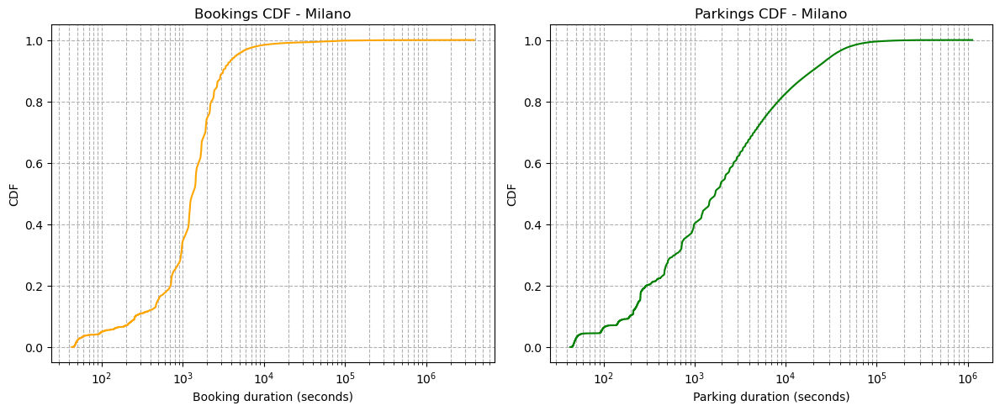

In [25]:
# =========================
# 📊 CDF Analysis for Milano
# =========================
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

# بازه‌ی زمانی مورد نظر
start_date = int(datetime(2017, 11, 1).timestamp())
end_date = int(datetime(2018, 1, 31, 23, 59, 59).timestamp())

# تعریف تابع برای گرفتن داده‌ها از هر کالکشن
def get_durations(city, collection_name):
    data = db[collection_name].find(
        {
            "city": city,
            "init_time": {"$gte": start_date, "$lte": end_date},
            "final_time": {"$exists": True, "$ne": None}
        },
        {"_id": 0, "init_time": 1, "final_time": 1}
    )
    durations = [(d["final_time"] - d["init_time"]) for d in data if d["final_time"] > d["init_time"]]
    return durations

# گرفتن داده‌ها برای دو سرویس (Car2Go + Enjoy)
bookings = (
    get_durations("Milano", "PermanentBookings") +
    get_durations("Milano", "enjoy_PermanentBookings")
)
parkings = (
    get_durations("Milano", "PermanentParkings") +
    get_durations("Milano", "enjoy_PermanentParkings")
)

# تابع برای محاسبه‌ی CDF
def compute_cdf(durations):
    sorted_durations = np.sort(durations)
    cdf = np.arange(1, len(sorted_durations) + 1) / len(sorted_durations)
    return sorted_durations, cdf

# محاسبه‌ی CDF برای هرکدام
bx, by = compute_cdf(bookings)
px, py = compute_cdf(parkings)

# 📈 رسم دو نمودار CDF برای شهر Milano
plt.figure(figsize=(12, 5))

# Bookings
plt.subplot(1, 2, 1)
plt.plot(bx, by, color="orange")
plt.xscale("log")
plt.xlabel("Booking duration (seconds)")
plt.ylabel("CDF")
plt.title("Bookings CDF - Milano")
plt.grid(True, which="both", ls="--")

# Parkings
plt.subplot(1, 2, 2)
plt.plot(px, py, color="green")
plt.xscale("log")
plt.xlabel("Parking duration (seconds)")
plt.ylabel("CDF")
plt.title("Parkings CDF - Milano")
plt.grid(True, which="both", ls="--")

plt.tight_layout()
plt.show()


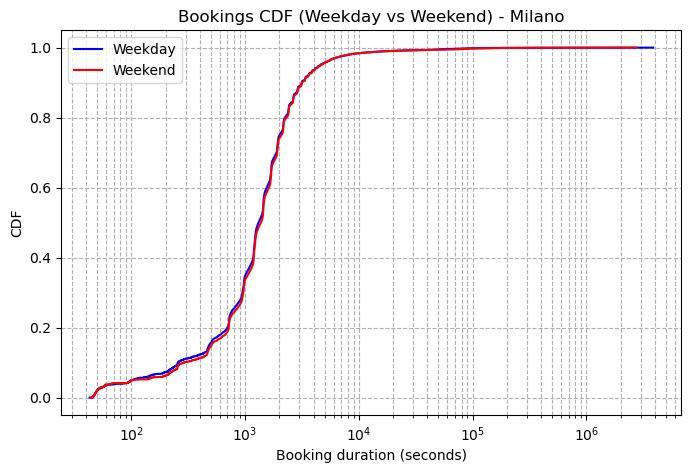

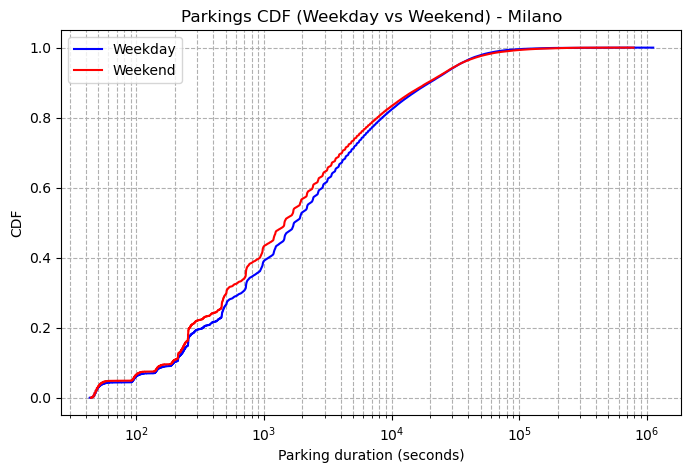

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd

# تابع برای گرفتن داده‌ها از دیتابیس (مثل قبل)
def get_durations_with_day(city, collection_name):
    data = db[collection_name].find(
        {
            "city": city,
            "init_time": {"$gte": start_date, "$lte": end_date},
            "final_time": {"$exists": True, "$ne": None}
        },
        {"_id": 0, "init_time": 1, "final_time": 1}
    )

    durations = []
    for d in data:
        if d["final_time"] > d["init_time"]:
            start_dt = datetime.fromtimestamp(d["init_time"])
            day_type = "Weekend" if start_dt.weekday() >= 5 else "Weekday"
            duration = d["final_time"] - d["init_time"]
            durations.append({"duration": duration, "day_type": day_type})
    return durations

# داده‌ها برای رزرو
bookings = (
    get_durations_with_day("Milano", "PermanentBookings") +
    get_durations_with_day("Milano", "enjoy_PermanentBookings")
)

# داده‌ها برای پارک
parkings = (
    get_durations_with_day("Milano", "PermanentParkings") +
    get_durations_with_day("Milano", "enjoy_PermanentParkings")
)

# تبدیل به DataFrame برای کار راحت‌تر
book_df = pd.DataFrame(bookings)
park_df = pd.DataFrame(parkings)

# تابع رسم CDF برای Weekday و Weekend
def plot_cdf_comparison(df, title, xlabel):
    plt.figure(figsize=(8, 5))
    for d_type, color in zip(["Weekday", "Weekend"], ["blue", "red"]):
        durations = np.sort(df.loc[df["day_type"] == d_type, "duration"])
        if len(durations) > 0:
            cdf = np.arange(1, len(durations) + 1) / len(durations)
            plt.plot(durations, cdf, label=d_type, color=color)
    plt.xscale("log")
    plt.xlabel(xlabel)
    plt.ylabel("CDF")
    plt.title(title + " - Milano")
    plt.grid(True, which="both", ls="--")
    plt.legend()
    plt.show()

# رسم نمودارها
plot_cdf_comparison(book_df, "Bookings CDF (Weekday vs Weekend)", "Booking duration (seconds)")
plot_cdf_comparison(park_df, "Parkings CDF (Weekday vs Weekend)", "Parking duration (seconds)")


/tmp/ipykernel_52/143192627.py:60: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  rental_hours = [pytz.utc.localize(datetime.utcfromtimestamp(r["init_time"])).astimezone(timezone).hour for r in rental_result]
/tmp/ipykernel_52/143192627.py:77: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  parking_hours = [pytz.utc.localize(datetime.utcfromtimestamp(p["init_time"])).astimezone(timezone).hour for p in parking_result]


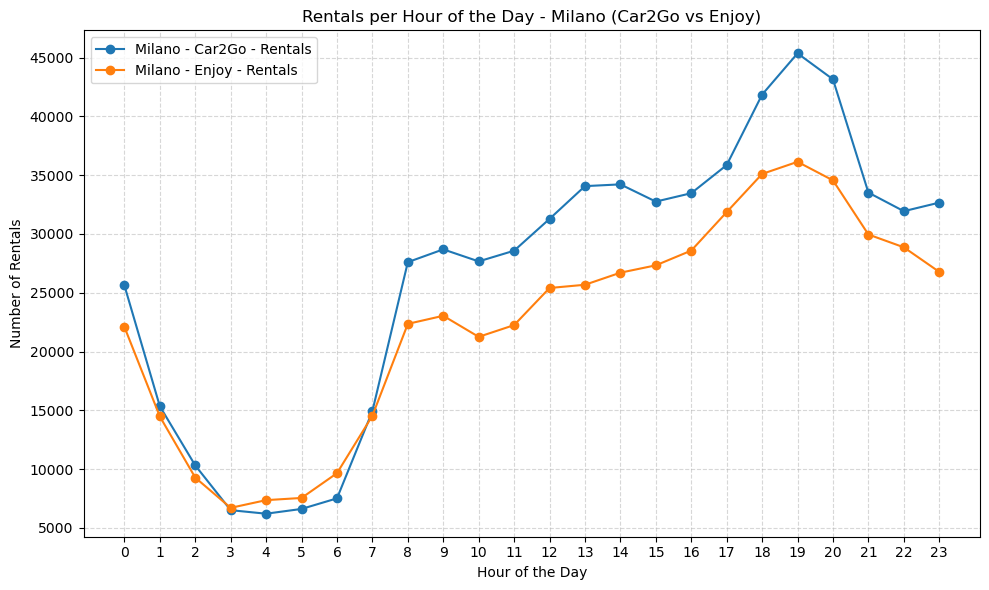

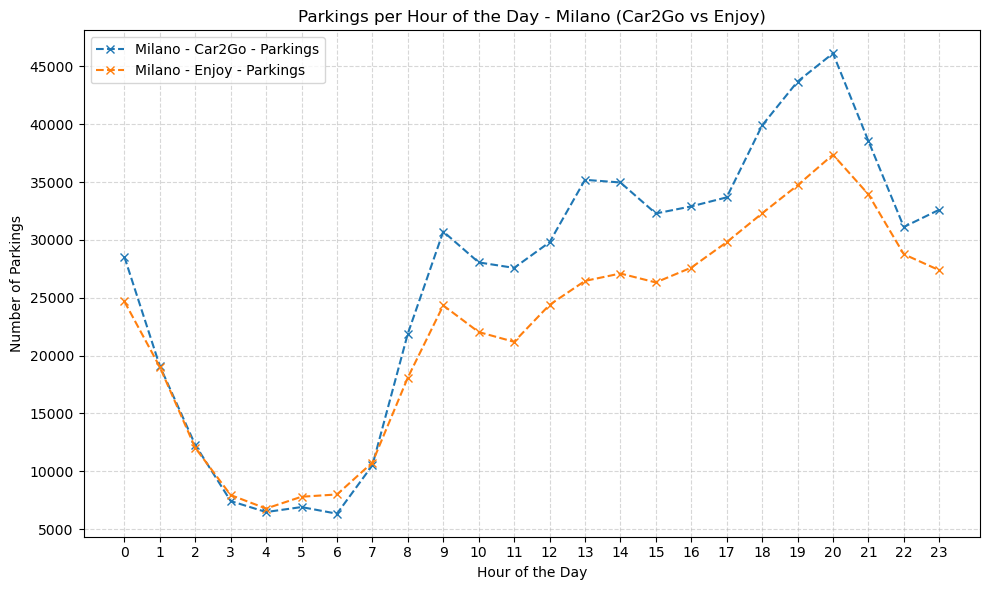

In [27]:
''' 2.2 - Milano '''
import matplotlib.pyplot as plt
from datetime import datetime
import pytz
from pymongo import MongoClient

# اتصال به دیتابیس
client = MongoClient(
    host="bigdatadb.polito.it",
    port=27017,
    username="ictts",
    password="Ict4SM22!",
    authSource="carsharing",
    ssl=True,
    tlsAllowInvalidCertificates=True
)
db = client["carsharing"]

# داده‌های دو سرویس در شهر Milano
city_data = {
    "Milano - Car2Go": {
        "rental_collection": db.PermanentBookings,
        "parking_collection": db.PermanentParkings,
        "service": "Car2Go",
        "timezone": pytz.timezone("Europe/Rome")
    },
    "Milano - Enjoy": {
        "rental_collection": db.enjoy_PermanentBookings,
        "parking_collection": db.enjoy_PermanentParkings,
        "service": "Enjoy",
        "timezone": pytz.timezone("Europe/Rome")
    }
}

# بازه زمانی
start_date = datetime(2017, 11, 1)
end_date = datetime(2018, 1, 31)

rental_data = []
parking_data = []

for city, data in city_data.items():
    rental_collection = data["rental_collection"]
    parking_collection = data["parking_collection"]
    service = data["service"]
    timezone = data["timezone"]

    # --- Rentals (Bookings) ---
    rental_pipeline = [
        {
            "$match": {
                "city": "Milano",
                "init_date": {"$gte": start_date, "$lte": end_date}
            }
        },
        {"$project": {"init_time": 1, "_id": 0}}
    ]
    rental_result = list(rental_collection.aggregate(rental_pipeline))

    rental_hours = [pytz.utc.localize(datetime.utcfromtimestamp(r["init_time"])).astimezone(timezone).hour for r in rental_result]
    rental_counts = [rental_hours.count(h) for h in range(24)]

    rental_data.append((list(range(24)), rental_counts, f"{city} - Rentals"))

    # --- Parkings ---
    parking_pipeline = [
        {
            "$match": {
                "city": "Milano",
                "init_date": {"$gte": start_date, "$lte": end_date}
            }
        },
        {"$project": {"init_time": 1, "_id": 0}}
    ]
    parking_result = list(parking_collection.aggregate(parking_pipeline))

    parking_hours = [pytz.utc.localize(datetime.utcfromtimestamp(p["init_time"])).astimezone(timezone).hour for p in parking_result]
    parking_counts = [parking_hours.count(h) for h in range(24)]

    parking_data.append((list(range(24)), parking_counts, f"{city} - Parkings"))


# ---- PLOT RENTALS ----
plt.figure(figsize=(10, 6))
for hours, counts, label in rental_data:
    plt.plot(hours, counts, marker='o', label=label)
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Rentals")
plt.title("Rentals per Hour of the Day - Milano (Car2Go vs Enjoy)")
plt.legend()
plt.xticks(range(24))
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# ---- PLOT PARKINGS ----
plt.figure(figsize=(10, 6))
for hours, counts, label in parking_data:
    plt.plot(hours, counts, marker='x', linestyle='--', label=label)
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Parkings")
plt.title("Parkings per Hour of the Day - Milano (Car2Go vs Enjoy)")
plt.legend()
plt.xticks(range(24))
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


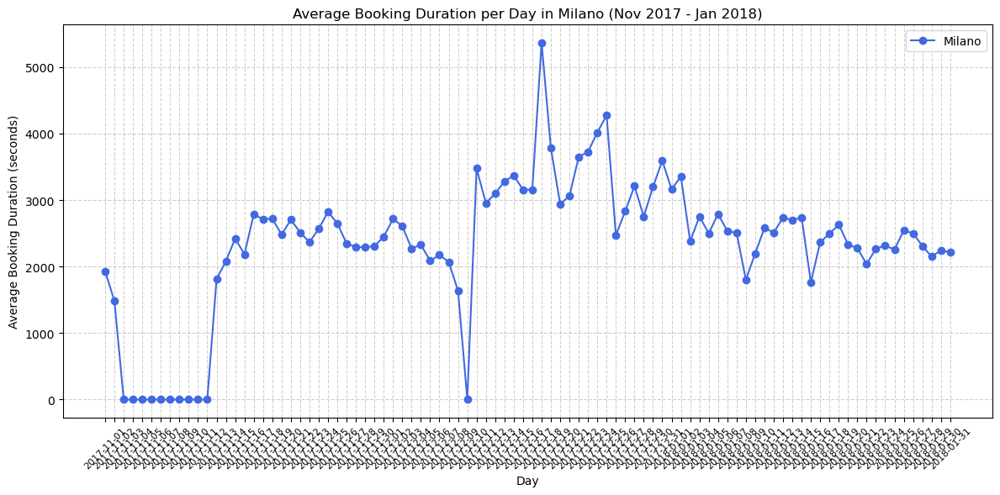

In [28]:
''' Step 2.3b – Detecting Daily Outliers for Milano '''

import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime, timedelta
from pymongo import MongoClient

# اتصال به دیتابیس
client = MongoClient(
    host="bigdatadb.polito.it",
    port=27017,
    username="ictts",
    password="Ict4SM22!",
    authSource="carsharing",
    ssl=True,
    tlsAllowInvalidCertificates=True
)

db = client["carsharing"]

# فقط برای Milano
collections = ['PermanentBookings', 'enjoy_PermanentBookings']

# بازه زمانی
start_date = datetime(2017, 11, 1)
end_date = datetime(2018, 1, 31, 23, 59, 59)

# تابع گرفتن داده‌ها برای هر کالکشن
def get_data_from_collection(collection_name):
    pipeline = [
        {
            "$match": {
                "city": "Milano",
                "init_time": {"$gte": int(start_date.timestamp()), "$lte": int(end_date.timestamp())},
                "final_time": {"$exists": True, "$ne": None},
                "init_time": {"$exists": True, "$ne": None}
            }
        },
        {
            "$project": {
                "init_time": 1,
                "duration": {"$subtract": ["$final_time", "$init_time"]}
            }
        }
    ]
    return list(db[collection_name].aggregate(pipeline))

# جمع‌آوری داده‌ها از هر دو سرویس
results = []
for coll in collections:
    results.extend(get_data_from_collection(coll))

if not results:
    print("هیچ داده‌ای برای میلان پیدا نشد.")
else:
    # گروه‌بندی روزانه
    daily_durations = {}
    for res in results:
        init_time = datetime.fromtimestamp(res["init_time"])
        day_key = init_time.strftime("%Y-%m-%d")
        if day_key not in daily_durations:
            daily_durations[day_key] = []
        daily_durations[day_key].append(res["duration"])

    # همه‌ی روزهای بین start و end
    all_days = [start_date + timedelta(days=i) for i in range((end_date - start_date).days + 1)]
    all_days_str = [day.strftime("%Y-%m-%d") for day in all_days]

    # میانگین هر روز
    avg_durations = []
    for day in all_days_str:
        if day in daily_durations:
            avg_durations.append(np.mean(daily_durations[day]))
        else:
            avg_durations.append(0)

    # رسم نمودار
    plt.figure(figsize=(12, 6))
    plt.plot(all_days_str, avg_durations, marker='o', color='royalblue', label='Milano')
    plt.xlabel('Day')
    plt.ylabel('Average Booking Duration (seconds)')
    plt.title('Average Booking Duration per Day in Milano (Nov 2017 - Jan 2018)')
    plt.xticks(rotation=45, fontsize=8)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    plt.tight_layout()
    plt.show()


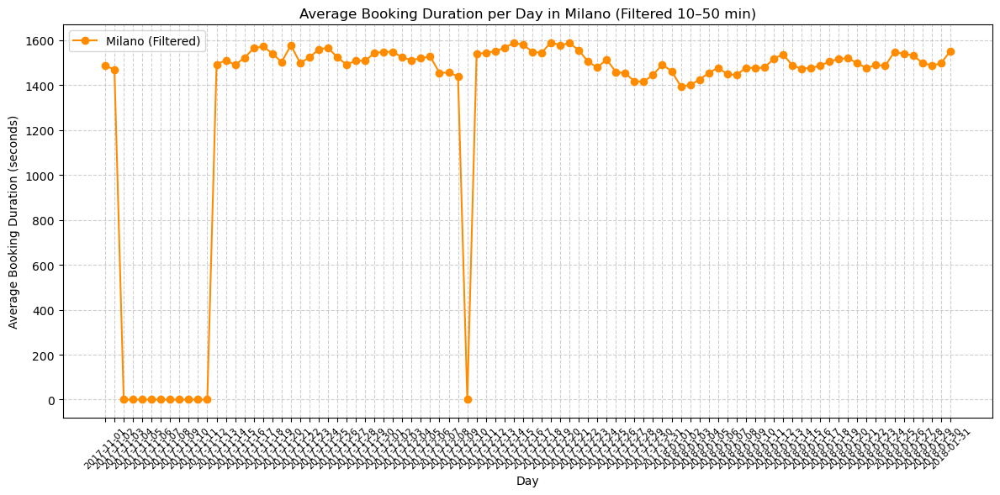

In [29]:
''' 2.3 – Filtering Outliers for Milano (Realistic Booking Durations) '''

import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime, timedelta
from pymongo import MongoClient

# اتصال به دیتابیس
client = MongoClient(
    host="bigdatadb.polito.it",
    port=27017,
    username="ictts",
    password="Ict4SM22!",
    authSource="carsharing",
    ssl=True,
    tlsAllowInvalidCertificates=True
)

db = client["carsharing"]

# فقط برای شهر میلان از هر دو سرویس
collections = ['PermanentBookings', 'enjoy_PermanentBookings']

# بازه زمانی
start_date = datetime(2017, 11, 1)
end_date = datetime(2018, 1, 31, 23, 59, 59)

# تابع جمع‌آوری داده از هر کالکشن
def get_data_from_collection(collection_name):
    pipeline = [
        {
            "$match": {
                "city": "Milano",
                "init_time": {"$gte": int(start_date.timestamp()), "$lte": int(end_date.timestamp())},
                "final_time": {"$exists": True, "$ne": None},
                "init_time": {"$exists": True, "$ne": None}
            }
        },
        {
            "$project": {
                "init_time": 1,
                "final_time": 1,
                "duration": {"$subtract": ["$final_time", "$init_time"]}
            }
        },
        {
            # نگه داشتن فقط رزروهای واقعی بین 10 تا 50 دقیقه (600 تا 3000 ثانیه)
            "$match": {
                "duration": {"$gte": 600, "$lte": 3000}
            }
        }
    ]

    try:
        return list(db[collection_name].aggregate(pipeline))
    except Exception as e:
        print(f"Error reading {collection_name}: {e}")
        return []

# داده‌ها از هر دو سرویس
results = []
for collection_name in collections:
    results.extend(get_data_from_collection(collection_name))

# بررسی وجود داده
if not results:
    print("⚠️ No results found for Milano.")
else:
    # گروه‌بندی داده‌ها به صورت روزانه
    daily_durations = {}

    for res in results:
        init_time = res["init_time"]
        duration = res["duration"]
        init_date = datetime.fromtimestamp(init_time).strftime("%Y-%m-%d")

        if init_date not in daily_durations:
            daily_durations[init_date] = []
        daily_durations[init_date].append(duration)

    # همه روزهای بازه مورد نظر
    all_days = [start_date + timedelta(days=i) for i in range((end_date - start_date).days + 1)]
    all_days_str = [d.strftime("%Y-%m-%d") for d in all_days]

    # محاسبه میانگین روزانه
    avg_durations = []
    for day in all_days_str:
        if day in daily_durations:
            avg_durations.append(np.mean(daily_durations[day]))
        else:
            avg_durations.append(0)

    # رسم نمودار
    plt.figure(figsize=(12, 6))
    plt.plot(all_days_str, avg_durations, marker='o', color='darkorange', label='Milano (Filtered)')
    plt.xlabel('Day')
    plt.ylabel('Average Booking Duration (seconds)')
    plt.title('Average Booking Duration per Day in Milano (Filtered 10–50 min)')
    plt.xticks(rotation=45, fontsize=8)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    plt.tight_layout()
    plt.show()


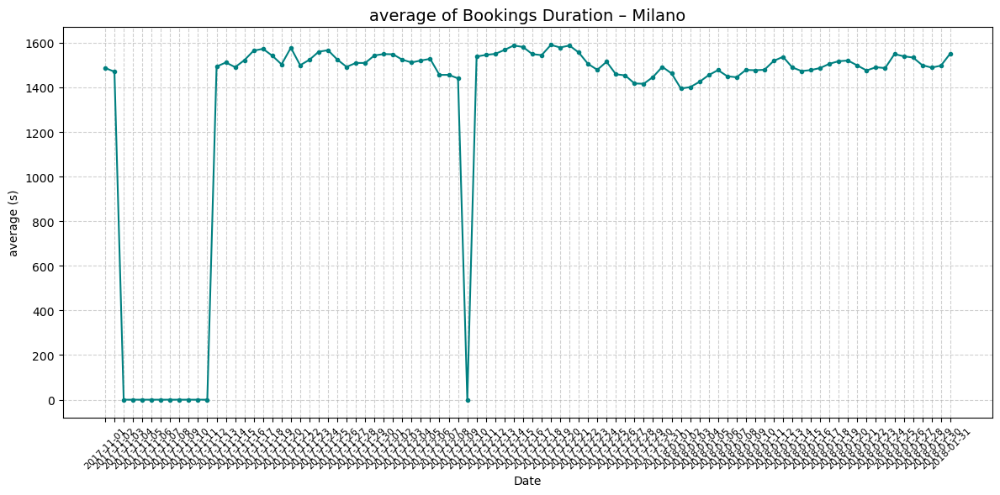

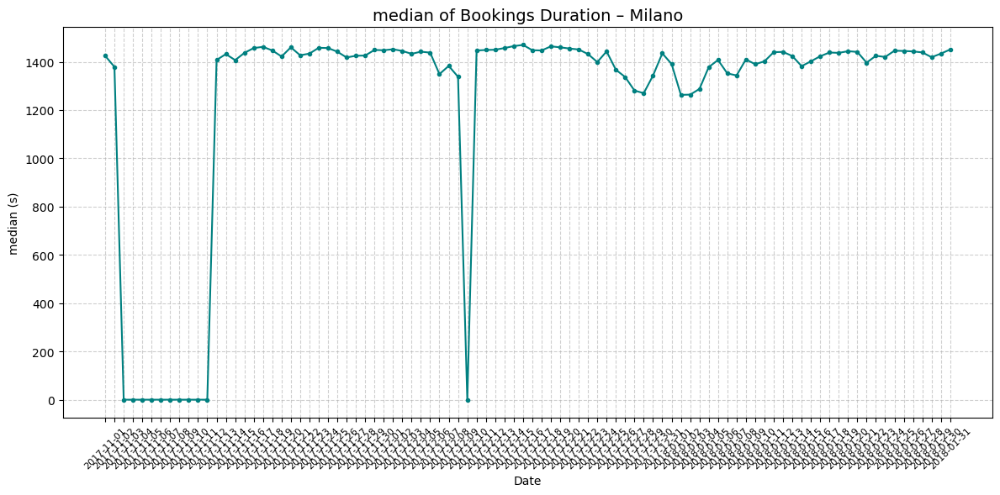

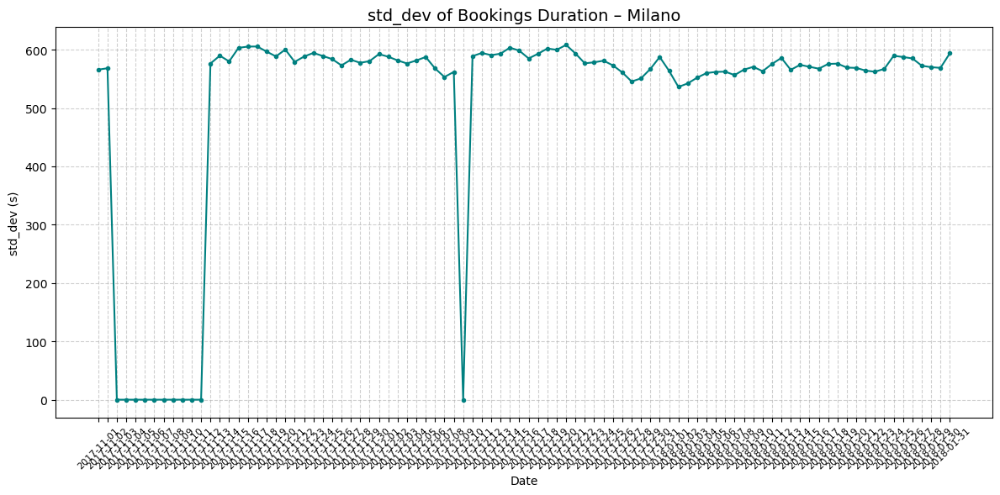

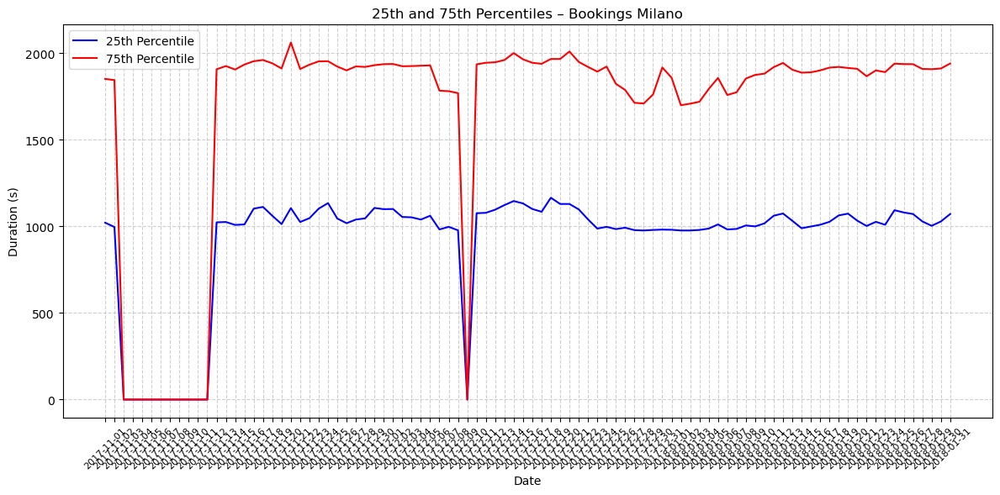

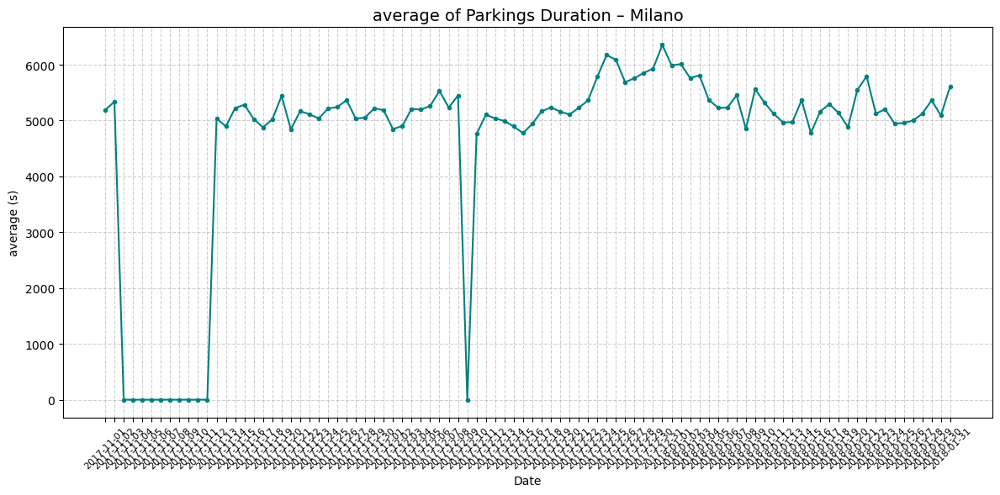

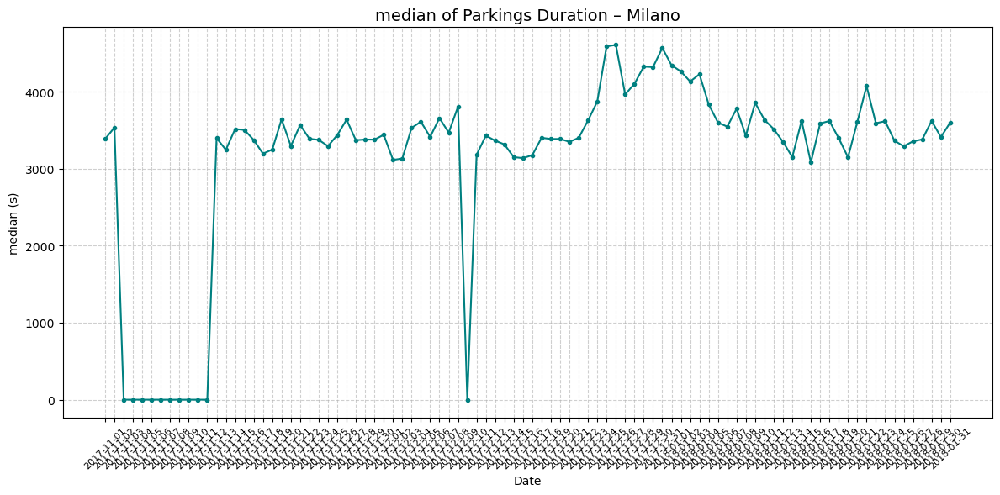

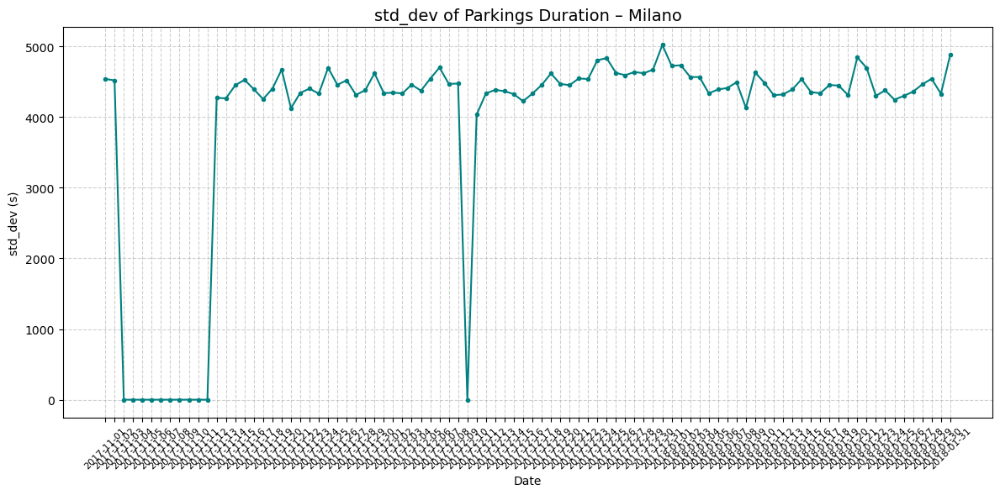

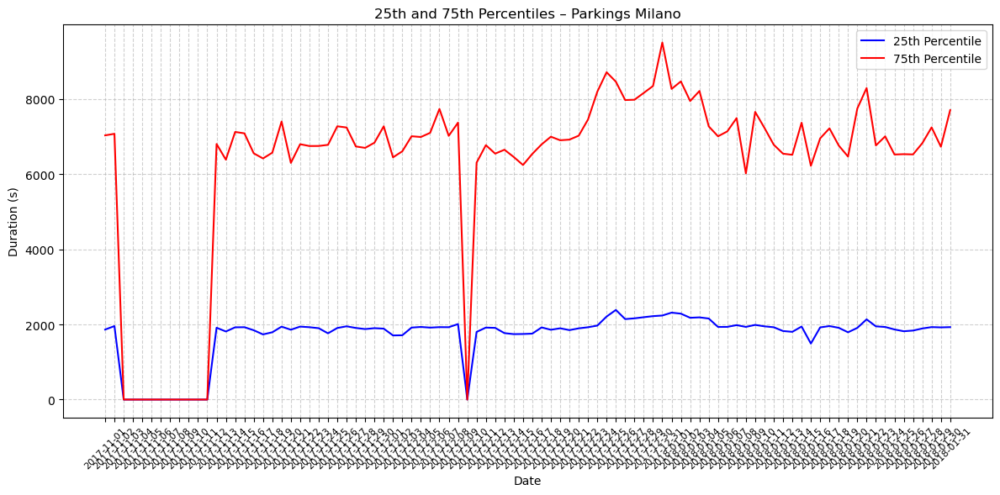

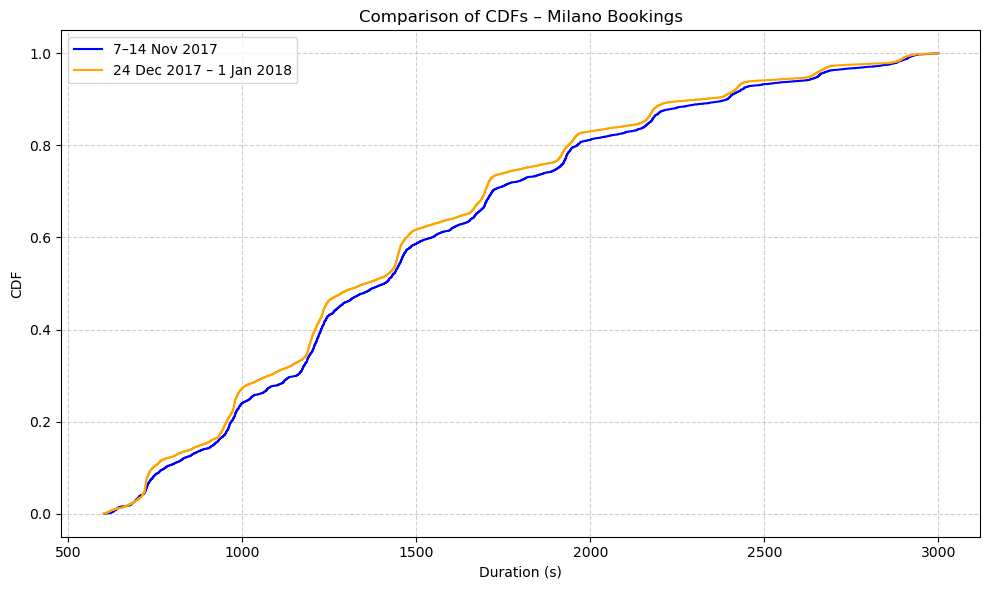

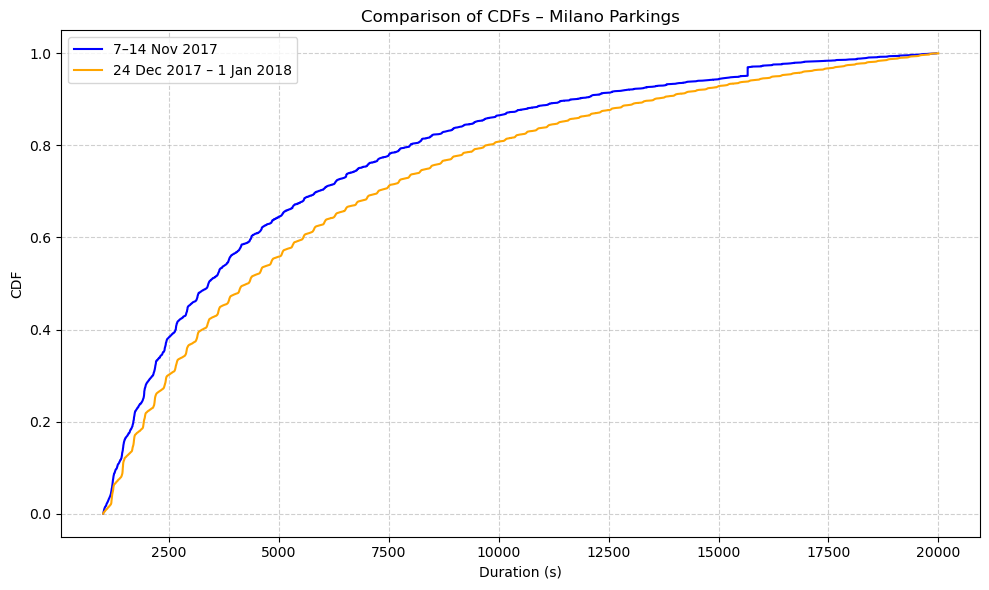

✅ All plots (12 total) generated successfully for Milano – Bookings + Parkings.


In [35]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime, timedelta
import statistics

# === تنظیمات اولیه ===
collections = ['PermanentBookings', 'enjoy_PermanentBookings']
parkings_collections = ['PermanentParkings', 'enjoy_PermanentParkings']

start_date = datetime(2017, 11, 1)
end_date = datetime(2018, 1, 31, 23, 59, 59)

# === تابع برای استخراج داده از دیتابیس با فیلتر زمان و طول مدت ===
def get_data_from_collection(collection_name, duration_filter):
    pipeline = [
        {
            "$match": {
                "city": "Milano",
                "init_time": {"$gte": int(start_date.timestamp()), "$lte": int(end_date.timestamp())},
                "final_time": {"$exists": True, "$ne": None},
                "init_time": {"$exists": True, "$ne": None}
            }
        },
        {
            "$project": {
                "city": 1,
                "init_time": 1,
                "final_time": 1,
                "duration": {"$subtract": ["$final_time", "$init_time"]}
            }
        },
        {
            "$match": {
                "duration": {"$gte": duration_filter[0], "$lte": duration_filter[1]}
            }
        }
    ]
    collection = db[collection_name]
    try:
        return list(collection.aggregate(pipeline))
    except Exception as e:
        print(f"Error during aggregation on {collection_name}: {e}")
        return []

# === جمع‌آوری داده از دو مجموعه ===
def collect_data(collection_names, duration_filter):
    results = []
    for name in collection_names:
        results.extend(get_data_from_collection(name, duration_filter))
    return results

bookings_data = collect_data(collections, (600, 3000))  # 10 تا 50 دقیقه
parkings_data = collect_data(parkings_collections, (1000, 20000))  # 15 دقیقه تا 5.5 ساعت

# === محاسبه آمار روزانه ===
def process_statistics(data):
    if not data:
        print("No results found.")
        return {}

    daily_durations = {}
    for res in data:
        init_time = res["init_time"]
        duration = res["duration"]
        day = datetime.fromtimestamp(init_time).strftime("%Y-%m-%d")
        if day not in daily_durations:
            daily_durations[day] = []
        daily_durations[day].append(duration)

    all_days = [start_date + timedelta(days=i) for i in range((end_date - start_date).days + 1)]
    all_days_str = [d.strftime("%Y-%m-%d") for d in all_days]

    stats = {}
    for day_str in all_days_str:
        if day_str in daily_durations:
            durations = daily_durations[day_str]
            stats[day_str] = {
                "average": np.mean(durations),
                "median": np.median(durations),
                "std_dev": np.std(durations),
                "percentiles": {
                    "25th": np.percentile(durations, 25),
                    "50th": np.percentile(durations, 50),
                    "75th": np.percentile(durations, 75)
                }
            }
        else:
            stats[day_str] = {
                "average": 0, "median": 0, "std_dev": 0,
                "percentiles": {"25th": 0, "50th": 0, "75th": 0}
            }
    return stats

bookings_stats = process_statistics(bookings_data)
parkings_stats = process_statistics(parkings_data)

# === تابع رسم آمار روزانه ===
def plot_statistic(stat_name, stats, all_days, category):
    y = [stats[d][stat_name.lower()] for d in all_days]
    plt.figure(figsize=(12, 6))
    plt.plot(all_days, y, color='teal', marker='o', markersize=3)
    plt.title(f"{stat_name} of {category.capitalize()} Duration – Milano", fontsize=14)
    plt.xlabel('Date')
    plt.ylabel(f"{stat_name} (s)")
    plt.xticks(rotation=45, fontsize=8)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# === رسم نمودارهای بوکینگ ===
all_days = sorted(bookings_stats.keys())
plot_statistic("average", bookings_stats, all_days, "Bookings")
plot_statistic("median", bookings_stats, all_days, "Bookings")
plot_statistic("std_dev", bookings_stats, all_days, "Bookings")

# === صدک‌های ۲۵ و ۷۵ ===
plt.figure(figsize=(12,6))
plt.plot(all_days, [bookings_stats[d]["percentiles"]["25th"] for d in all_days], label="25th Percentile", color="blue")
plt.plot(all_days, [bookings_stats[d]["percentiles"]["75th"] for d in all_days], label="75th Percentile", color="red")
plt.title("25th and 75th Percentiles – Bookings Milano")
plt.xlabel("Date"); plt.ylabel("Duration (s)")
plt.xticks(rotation=45, fontsize=8)
plt.legend(); plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout(); plt.show()

# === رسم نمودارهای پارکینگ ===
plot_statistic("average", parkings_stats, all_days, "Parkings")
plot_statistic("median", parkings_stats, all_days, "Parkings")
plot_statistic("std_dev", parkings_stats, all_days, "Parkings")

plt.figure(figsize=(12,6))
plt.plot(all_days, [parkings_stats[d]["percentiles"]["25th"] for d in all_days], label="25th Percentile", color="blue")
plt.plot(all_days, [parkings_stats[d]["percentiles"]["75th"] for d in all_days], label="75th Percentile", color="red")
plt.title("25th and 75th Percentiles – Parkings Milano")
plt.xlabel("Date"); plt.ylabel("Duration (s)")
plt.xticks(rotation=45, fontsize=8)
plt.legend(); plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout(); plt.show()

# === توابع CDF ===
def filter_data_by_date_range(data, start_date, end_date):
    s = int(datetime.strptime(start_date, "%Y-%m-%d").timestamp())
    e = int(datetime.strptime(end_date, "%Y-%m-%d").timestamp())
    return [r for r in data if s <= r["init_time"] <= e]

def calculate_cdf(data):
    durations = [r["duration"] for r in data if r.get("duration")]
    sorted_d = np.sort(durations)
    cdf = np.arange(1, len(sorted_d)+1) / len(sorted_d)
    return sorted_d, cdf

def plot_cdf(data_nov, data_dec, title):
    d1, c1 = calculate_cdf(data_nov)
    d2, c2 = calculate_cdf(data_dec)
    plt.figure(figsize=(10,6))
    plt.plot(d1, c1, label="7–14 Nov 2017", color="blue")
    plt.plot(d2, c2, label="24 Dec 2017 – 1 Jan 2018", color="orange")
    plt.title(title)
    plt.xlabel("Duration (s)"); plt.ylabel("CDF")
    plt.legend(); plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout(); plt.show()

# === مقایسه CDF برای Milano ===
b_nov = filter_data_by_date_range(bookings_data, "2017-11-07", "2017-11-14")
b_dec = filter_data_by_date_range(bookings_data, "2017-12-24", "2018-01-01")
p_nov = filter_data_by_date_range(parkings_data, "2017-11-07", "2017-11-14")
p_dec = filter_data_by_date_range(parkings_data, "2017-12-24", "2018-01-01")

plot_cdf(b_nov, b_dec, "Comparison of CDFs – Milano Bookings")
plot_cdf(p_nov, p_dec, "Comparison of CDFs – Milano Parkings")

print("✅ All plots (12 total) generated successfully for Milano – Bookings + Parkings.")


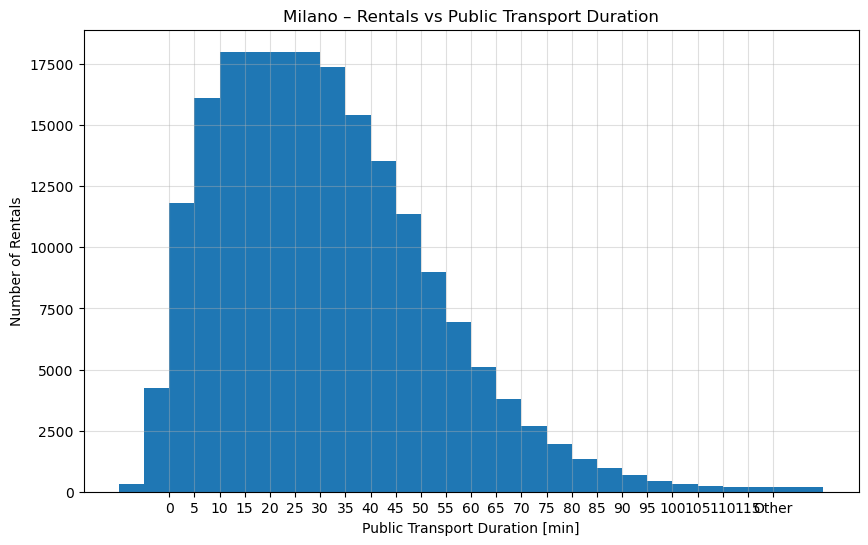

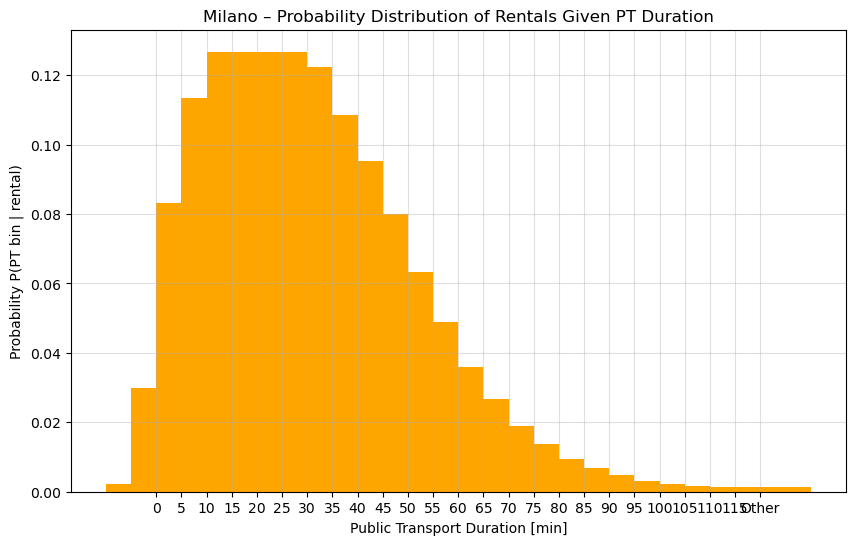

In [40]:
''' 2.6 – Milano '''
from pymongo import MongoClient
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# اتصال به دیتابیس (در صورت نیاز)
# client = MongoClient("mongodb://bigdatadb.polito.it:27017/")
# db = client["carsharing"]

# --- تنظیم بازه زمانی ---
time_start = datetime(2017, 11, 1)
time_end = datetime(2018, 1, 31)
start_unix = time_start.timestamp()
end_unix = time_end.timestamp()

# --- تعریف بازه‌های 5 دقیقه‌ای (0 تا 120 دقیقه) ---
bins = list(range(0, 125, 5))

# --- pipeline برای میلان ---
pipeline = [
    {
        "$match": {
            "$and": [
                {"city": "Milano"},
                {"init_time": {"$gte": start_unix, "$lte": end_unix}},
                {"final_time": {"$gte": start_unix, "$lte": end_unix}},
                {"public_transport.duration": {"$ne": None, "$gt": 0}},
                {"public_transport.distance": {"$ne": -1}}
            ]
        }
    },
    {
        "$project": {
            "duration": {"$subtract": ["$final_time", "$init_time"]},
            "pt_duration": {"$divide": ["$public_transport.duration", 60]},  # تبدیل ثانیه به دقیقه
            "moved": {
                "$ne": [
                    {"$arrayElemAt": ["$origin_destination.coordinates", 0]},
                    {"$arrayElemAt": ["$origin_destination.coordinates", 1]}
                ]
            }
        }
    },
    {
        "$match": {
            "duration": {"$gte": 300, "$lte": 7200},  # بین 5 تا 120 دقیقه
            "moved": True
        }
    },
    {
        "$bucket": {
            "groupBy": "$pt_duration",
            "boundaries": bins,
            "default": "Other",
            "output": {"count": {"$sum": 1}}
        }
    }
]

# اجرای pipeline روی Enjoy (که داده‌های PT دارد)
try:
    cursor = db.enjoy_PermanentBookings.aggregate(pipeline)
    cursor_list = list(cursor)

    if not cursor_list:
        print("No data found for Milano with public transport information.")
    else:
        # استخراج داده‌ها برای ترسیم
        bin_val = np.array([x["count"] for x in cursor_list])
        time_slot = np.array([x["_id"] for x in cursor_list])

        # --- نمودار 1: تعداد بوکینگ‌ها ---
        plt.figure(figsize=(10, 6))
        plt.bar(time_slot, bin_val, width=4)
        plt.ylabel("Number of Rentals")
        plt.xlabel("Public Transport Duration [min]")
        plt.title("Milano – Rentals vs Public Transport Duration")
        plt.grid(alpha=0.4)
        plt.show()

        # --- نمودار 2: احتمال ---
        total = sum(bin_val)
        prob = bin_val / total if total > 0 else np.zeros_like(bin_val)

        plt.figure(figsize=(10, 6))
        plt.bar(time_slot, prob, width=4, color="orange")
        plt.ylabel("Probability P(PT bin | rental)")
        plt.xlabel("Public Transport Duration [min]")
        plt.title("Milano – Probability Distribution of Rentals Given PT Duration")
        plt.grid(alpha=0.4)
        plt.show()

except Exception as e:
    print(f"An error occurred: {e}")


In [32]:
!pip3 install "contextily"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 41.5 MB/s  0:00:00m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8/8 [contextily]8 [geopy]io]


In [41]:
''' 2.7 – Milano '''
import pymongo as pm
from datetime import datetime
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
import contextily as cx
from shapely.geometry import Point, Polygon
import numpy as np
import matplotlib.pyplot as plt

# اتصال به دیتابیس (در صورت نیاز فعال کن)
# client = pm.MongoClient("mongodb://bigdatadb.polito.it:27017/")
# db = client["carsharing"]

service = "enjoy"  # برای Milano فقط Enjoy داده دارد

# ------------------- توابع همان قبلی‌اند، تغییر فقط در پارامتر city -------------------

def plot_OD_with_legend(db, service, city, date, start_hour, end_hour, plot=True, save=True):
    collection_name = 'PermanentBookings' if service == 'car2go' else 'enjoy_PermanentBookings'
    Bookings = db[collection_name]

    time_start = datetime(date.year, date.month, date.day, start_hour, 0, 0)
    time_end = datetime(date.year, date.month, date.day, end_hour, 0, 0)
    start_unix = time_start.timestamp()
    end_unix = time_end.timestamp()

    book = Bookings.aggregate([
        {'$match': {'city': city, 'init_time': {'$gte': start_unix, '$lte': end_unix}}},
        {'$project': {
            'start_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 0]},
            'start_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 1]},
            'end_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]},
            'end_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 1]},
            'duration': {'$subtract': ['$final_time', '$init_time']},
            'moved': {'$ne': [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]}
        }},
        {'$match': {'duration': {'$gte': 300, '$lte': 7200}, 'moved': True}},
        {'$sort': {'_id': 1}}
    ], allowDiskUse=True)

    df_book = pd.DataFrame(list(book))
    if df_book.empty:
        print(f"No booking data found for {city} on {date.strftime('%d/%m/%Y')}.")
        return None, None

    origin_gdf = GeoDataFrame(df_book, geometry=gpd.points_from_xy(df_book['start_lon'], df_book['start_lat']), crs="EPSG:4326")
    destination_gdf = GeoDataFrame(df_book, geometry=gpd.points_from_xy(df_book['end_lon'], df_book['end_lat']), crs="EPSG:4326")

    if plot:
        origin_wm = origin_gdf.to_crs(epsg=3857)
        destination_wm = destination_gdf.to_crs(epsg=3857)
        fig, ax = plt.subplots(figsize=(10, 10))
        origin_wm.plot(ax=ax, color='blue', alpha=0.5, markersize=10, label='Origin')
        destination_wm.plot(ax=ax, color='red', alpha=0.5, markersize=10, label='Destination')
        plt.legend()
        plt.ylabel('Coord. Y [m]')
        plt.xlabel('Coord. X [m]')
        plt.title(f'{city}, {date.strftime("%d/%m/%Y")}, Origin and Destination {start_hour}:00–{end_hour}:00')
        cx.add_basemap(ax, zoom=12)
        if save:
            plt.savefig(f'{city}_{date.strftime("%Y%m%d")}_{start_hour}_{end_hour}_OD_plot.jpg')
        plt.show()
    return origin_gdf, destination_gdf


def plot_density_grid(db, service, city, date, start_hour, end_hour, plot=False, save=False):
    collection_name = 'PermanentParkings' if service == 'car2go' else 'enjoy_PermanentParkings'
    Parkings = db[collection_name]

    time_start = datetime(date.year, date.month, date.day, start_hour, 0, 0)
    time_end = datetime(date.year, date.month, date.day, end_hour, 0, 0)
    start_unix = time_start.timestamp()
    end_unix = time_end.timestamp()

    park = Parkings.aggregate([
        {'$match': {'city': city, 'init_time': {'$gte': start_unix, '$lte': end_unix}}},
        {'$project': {
            'lon': {"$arrayElemAt": ["$loc.coordinates", 0]},
            'lat': {"$arrayElemAt": ["$loc.coordinates", 1]},
            'duration': {'$subtract': ['$final_time', '$init_time']}
        }},
        {'$match': {'duration': {'$gte': 300, '$lte': 86400}}},
        {'$sort': {'_id': 1}}
    ], allowDiskUse=True)

    df_park = pd.DataFrame(list(park))
    if df_park.empty:
        print(f"No parking data found for {city} on {date.strftime('%d/%m/%Y')}.")
        return None

    min_lon, max_lon = df_park["lon"].min(), df_park["lon"].max()
    min_lat, max_lat = df_park["lat"].min(), df_park["lat"].max()
    n_cols, n_rows = 27, 25
    cols = np.linspace(min_lon - 0.00001, max_lon + 0.00001, num=n_cols)
    rows = np.linspace(min_lat - 0.00001, max_lat + 0.00001, num=n_rows)

    df_park['col'] = np.searchsorted(cols, df_park["lon"])
    df_park['row'] = np.searchsorted(rows, df_park["lat"])
    df_park["zone_id"] = df_park["row"].astype(str) + df_park["col"].astype(str)

    res = df_park.groupby(['row', 'col', 'zone_id'])['zone_id'].count().reset_index(name='count')
    res["dens"] = res["count"] / res["count"].sum() * 100
    res["lon_min"], res["lon_max"] = cols[res["col"] - 1], cols[res["col"]]
    res["lat_min"], res["lat_max"] = rows[res["row"] - 1], rows[res["row"]]
    res['geometry'] = res.apply(lambda r: Polygon([
        Point(r.lon_min, r.lat_min),
        Point(r.lon_max, r.lat_min),
        Point(r.lon_max, r.lat_max),
        Point(r.lon_min, r.lat_max)]), axis=1)

    gdf = GeoDataFrame(res, geometry='geometry', crs="EPSG:4326")
    if plot:
        df_wm = gdf.to_crs(epsg=3857)
        ax = df_wm.plot(figsize=(10, 10), column="count", legend=True,
                        legend_kwds={"label": "N of cars in the area"}, alpha=0.5)
        plt.title(f'{city}, {date.strftime("%d/%m/%Y")} {start_hour}:00–{end_hour}:00')
        cx.add_basemap(ax, zoom=12)
        if save:
            plt.savefig(f'{city}_{date.strftime("%Y%m%d")}_{start_hour}_{end_hour}_density.jpg')
        plt.show()
    return gdf


def plot_OD(db, service, city, date, start_hour, end_hour, plot=False, save=False):
    collection_name = 'PermanentBookings' if service == 'car2go' else 'enjoy_PermanentBookings'
    Bookings = db[collection_name]

    time_start = datetime(date.year, date.month, date.day, start_hour, 0, 0)
    time_end = datetime(date.year, date.month, date.day, end_hour, 0, 0)
    start_unix = time_start.timestamp()
    end_unix = time_end.timestamp()

    book = Bookings.aggregate([
        {'$match': {'city': city, 'init_time': {'$gte': start_unix, '$lte': end_unix}}},
        {'$project': {
            'start_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 0]},
            'start_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 1]},
            'end_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]},
            'end_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 1]},
            'duration': {'$subtract': ['$final_time', '$init_time']},
            'moved': {'$ne': [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]}
        }},
        {'$match': {'duration': {'$gte': 300, '$lte': 7200}, 'moved': True}},
        {'$sort': {'_id': 1}}
    ], allowDiskUse=True)

    df_book = pd.DataFrame(list(book))
    if df_book.empty:
        print(f"No booking data for {city} on {date.strftime('%d/%m/%Y')}.")
        return None

    # ساخت شبکه و محاسبه تفاوت مبدأ و مقصد
    min_lon, max_lon = df_book["start_lon"].min(), df_book["end_lon"].max()
    min_lat, max_lat = df_book["start_lat"].min(), df_book["end_lat"].max()
    n_cols, n_rows = 27, 28
    cols = np.linspace(min_lon - 0.00001, max_lon + 0.00001, num=n_cols)
    rows = np.linspace(min_lat - 0.00001, max_lat + 0.00001, num=n_rows)

    df_book['col_start'] = np.searchsorted(cols, df_book["start_lon"])
    df_book['row_start'] = np.searchsorted(rows, df_book["start_lat"])
    df_book['col_end'] = np.searchsorted(cols, df_book["end_lon"])
    df_book['row_end'] = np.searchsorted(rows, df_book["end_lat"])

    start_res = df_book.groupby(['row_start', 'col_start']).size().reset_index(name='Nstart')
    end_res = df_book.groupby(['row_end', 'col_end']).size().reset_index(name='Nend')

    res = pd.merge(start_res, end_res, left_on=['row_start', 'col_start'],
                   right_on=['row_end', 'col_end'], how='outer')
    res["delta"] = res["Nend"].fillna(0) - res["Nstart"].fillna(0)
    res['geometry'] = res.apply(lambda r: Polygon([
        Point(cols[r.col_start - 1], rows[r.row_start - 1]),
        Point(cols[r.col_start], rows[r.row_start - 1]),
        Point(cols[r.col_start], rows[r.row_start]),
        Point(cols[r.col_start - 1], rows[r.row_start])]), axis=1)

    gdf = GeoDataFrame(res, geometry='geometry', crs="EPSG:4326")
    if plot:
        df_wm = gdf.to_crs(epsg=3857)
        ax = df_wm.plot(figsize=(10, 10), column="delta", legend=True,
                        legend_kwds={"label": "Δ departures - arrivals"}, alpha=0.5)
        plt.title(f'{city}, {date.strftime("%d/%m/%Y")} {start_hour}:00–{end_hour}:00')
        cx.add_basemap(ax, zoom=12)
        if save:
            plt.savefig(f'{city}_{date.strftime("%Y%m%d")}_{start_hour}_{end_hour}_OD_delta.jpg')
        plt.show()
    return gdf


# --- اجرای نهایی برای Milano ---
cities_names = ["Milano"]
dates = [datetime(2018, 1, 15), datetime(2018, 1, 16), datetime(2018, 1, 17), datetime(2018, 1, 21)]
hours = [(8, 10), (18, 20)]

for date in dates:
    for start_hour, end_hour in hours:
        for city in cities_names:
            print(f"Analyzing {service} data for {city} on {date.strftime('%d/%m/%Y')} from {start_hour}:00 to {end_hour}:00")
            plot_OD_with_legend(db, service, city, date, start_hour, end_hour, plot=True, save=True)
            plot_density_grid(db, service, city, date, start_hour, end_hour, plot=True, save=True)
            plot_OD(db, service, city, date, start_hour, end_hour, plot=False, save=True)


ModuleNotFoundError: No module named 'geopandas'

In [42]:
!pip3 install "geopandas"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.6/27.6 MB 59.6 MB/s  0:00:006m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 27.3 MB/s  0:00:006m0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 19.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [geopandas]/4 [geopandas]


Analyzing enjoy data for Milano on 15/01/2018 8:00–10:00


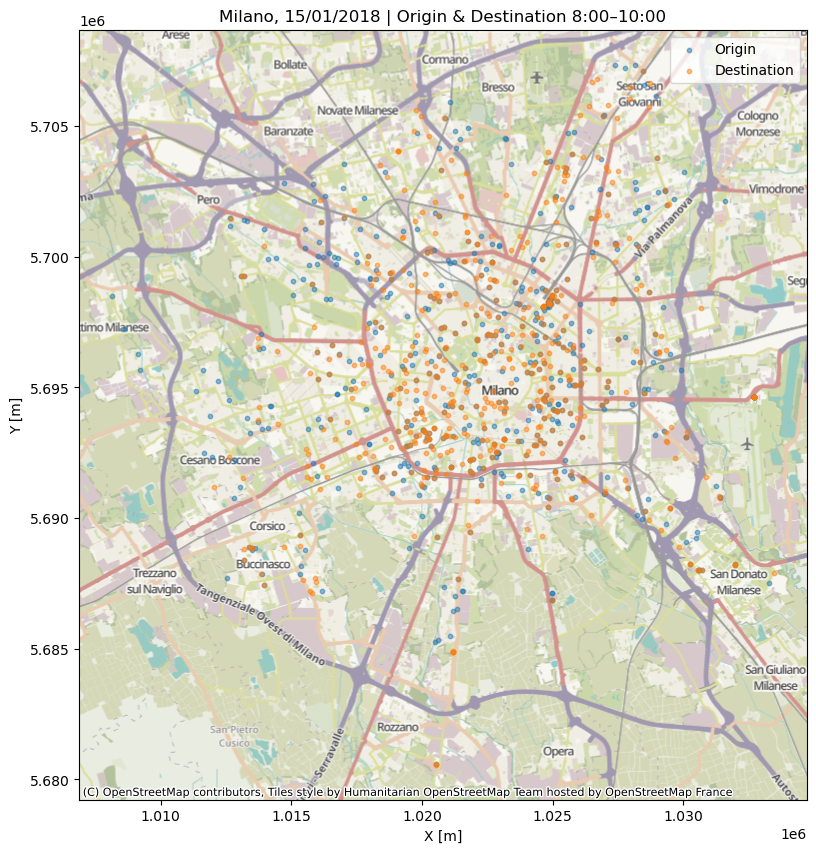

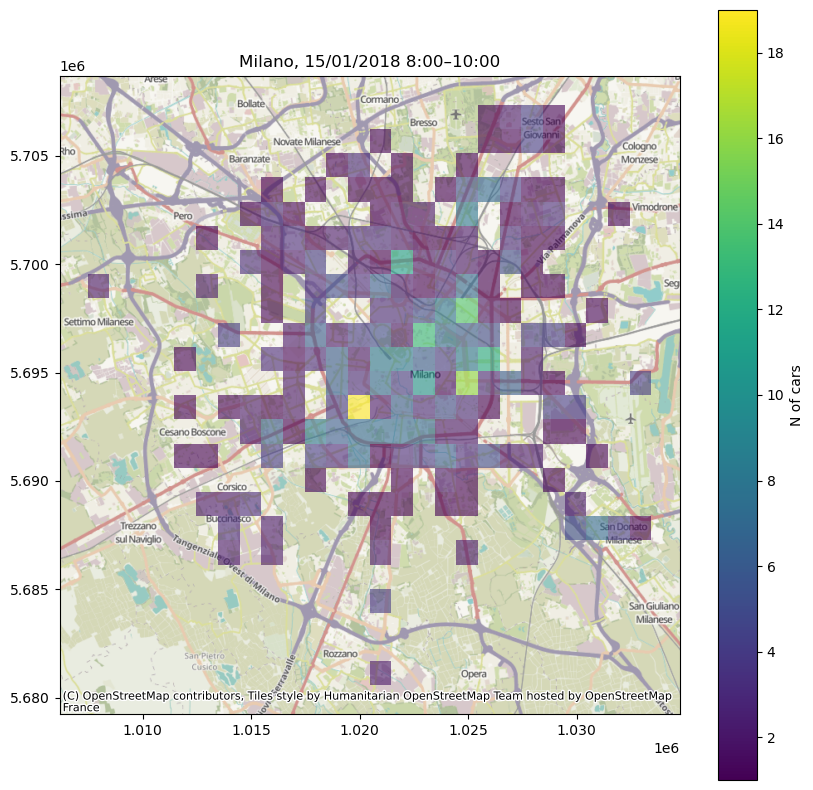

Analyzing enjoy data for Milano on 15/01/2018 18:00–20:00


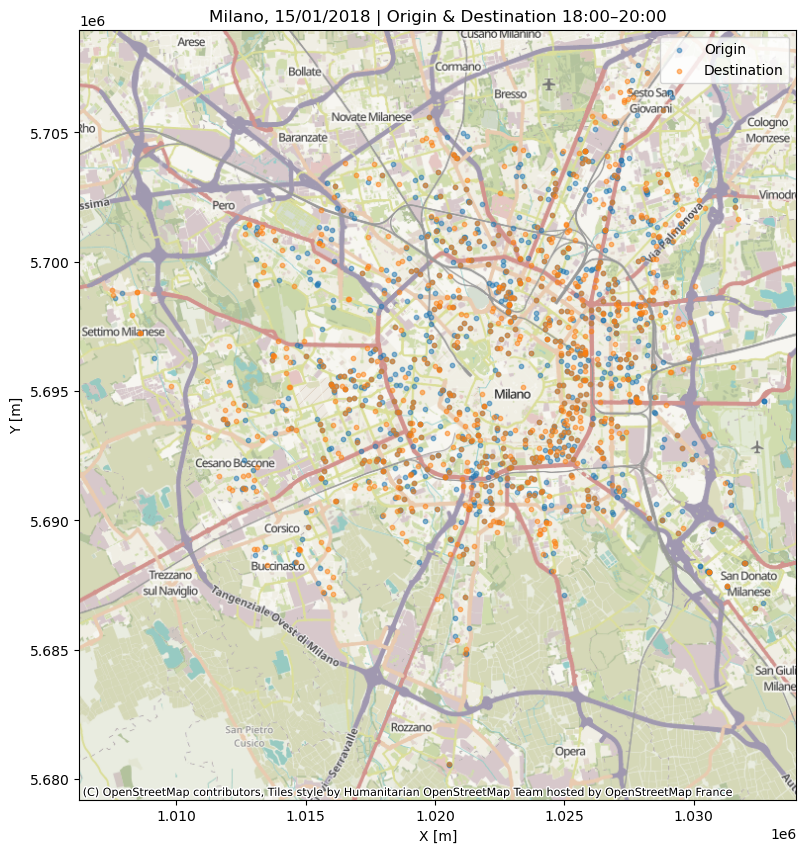

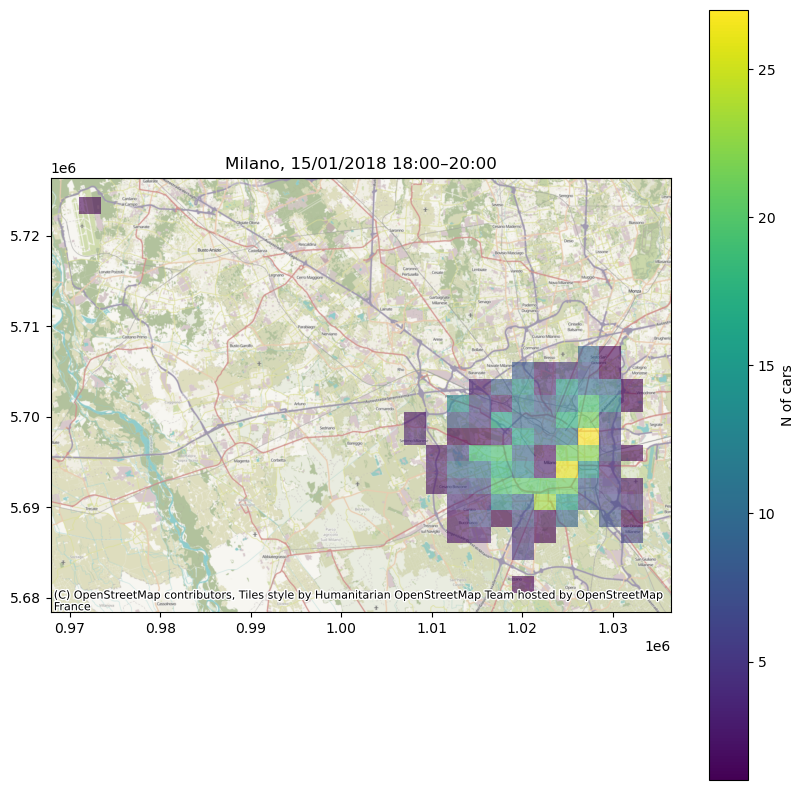

Analyzing enjoy data for Milano on 16/01/2018 8:00–10:00


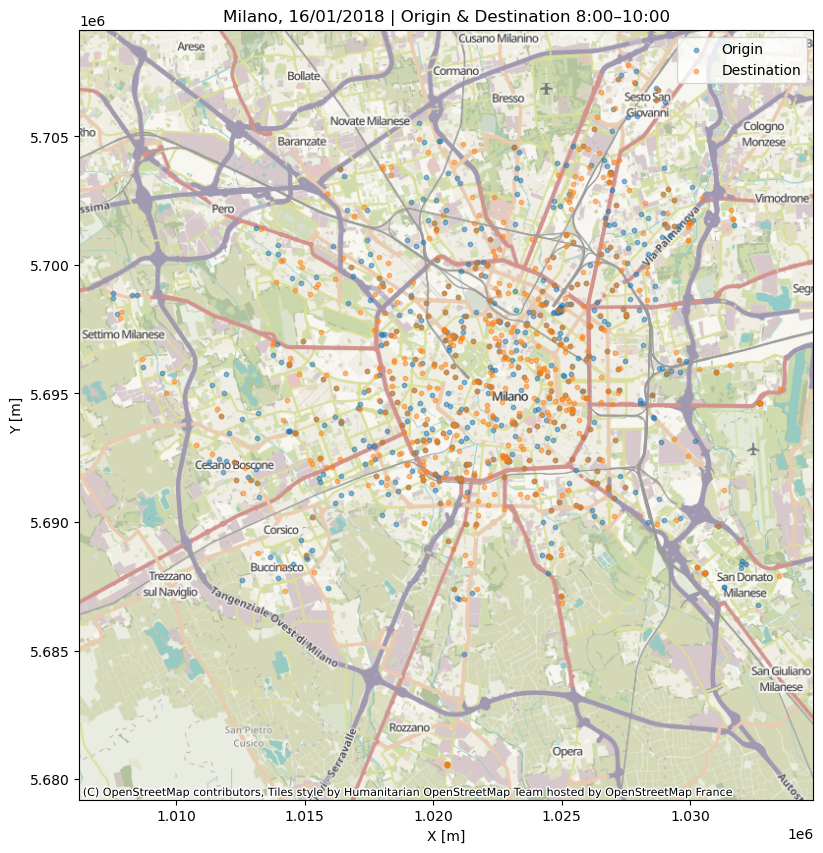

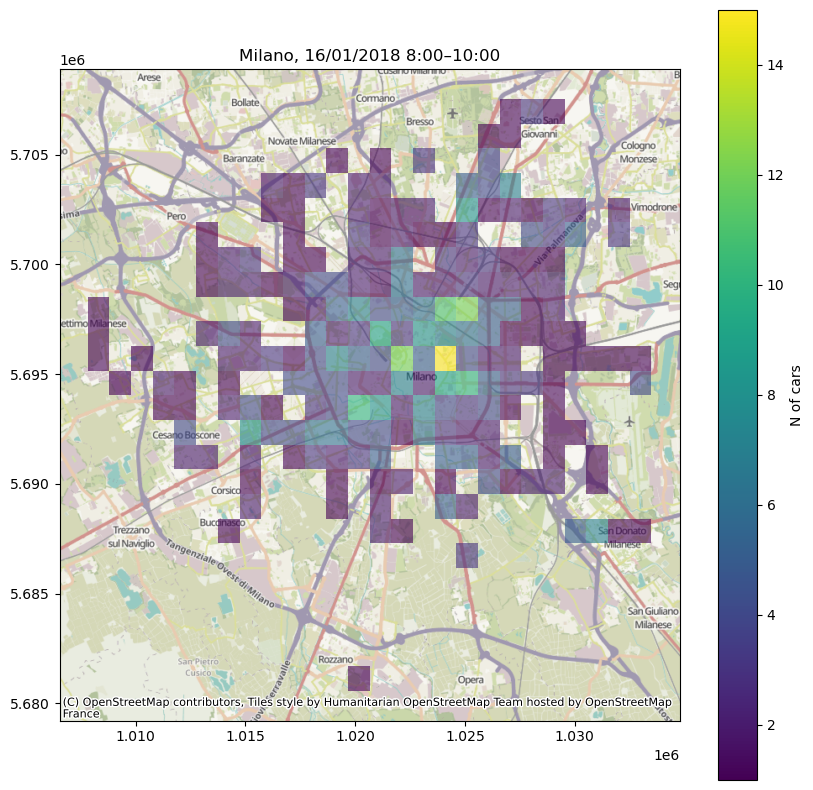

Analyzing enjoy data for Milano on 16/01/2018 18:00–20:00


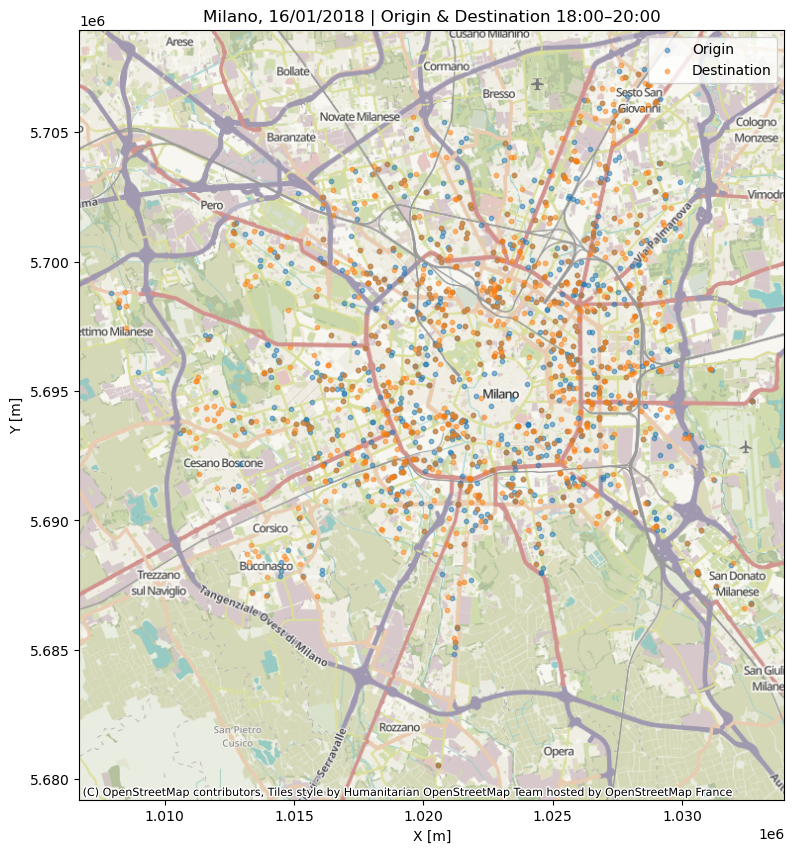

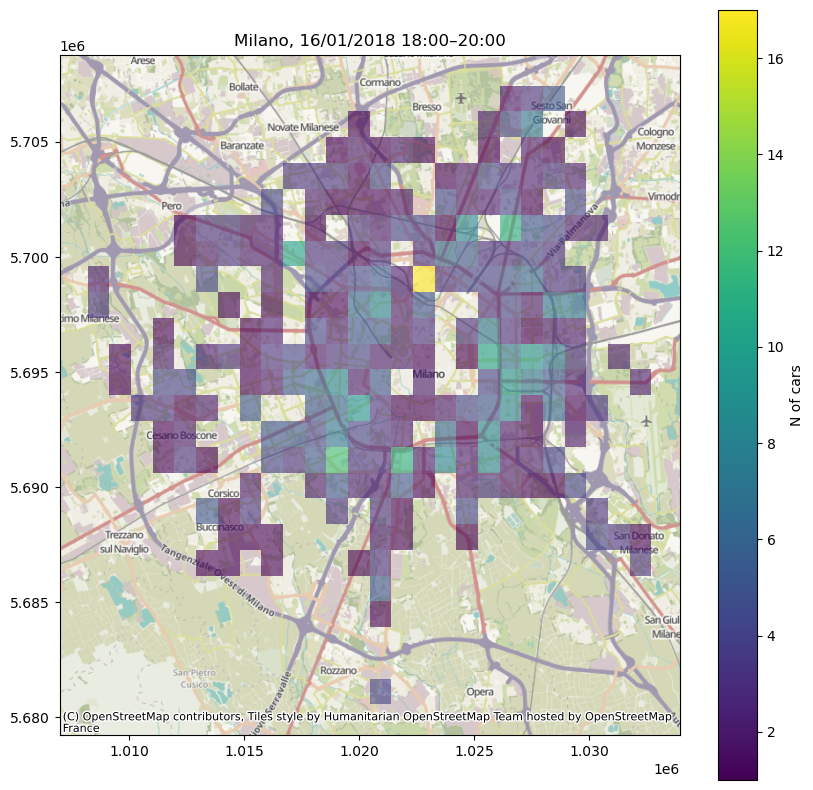

Analyzing enjoy data for Milano on 17/01/2018 8:00–10:00


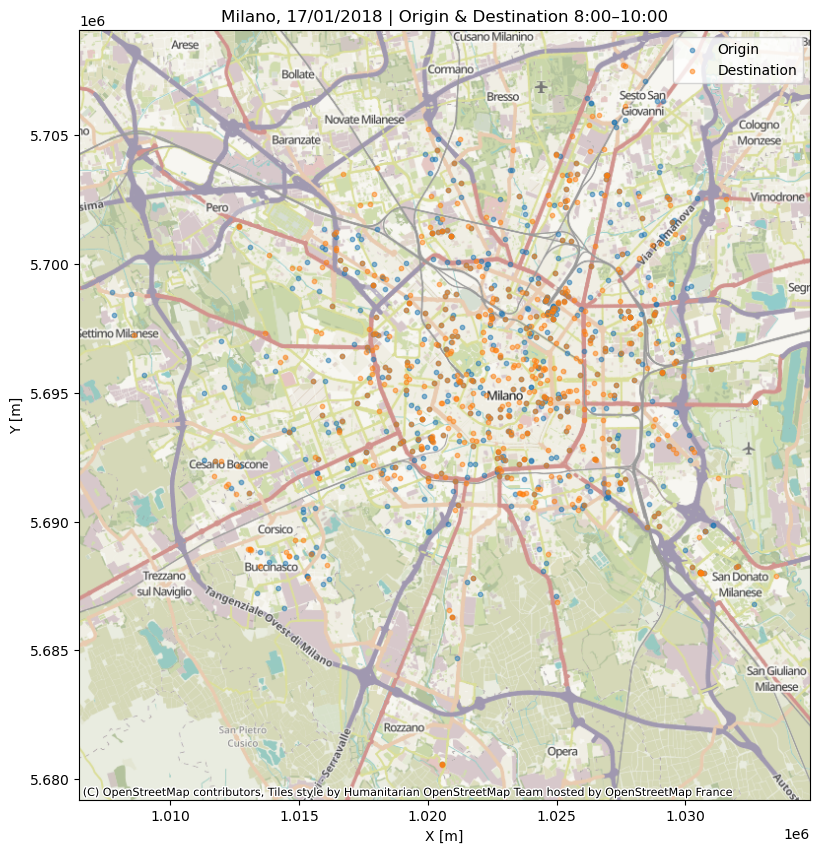

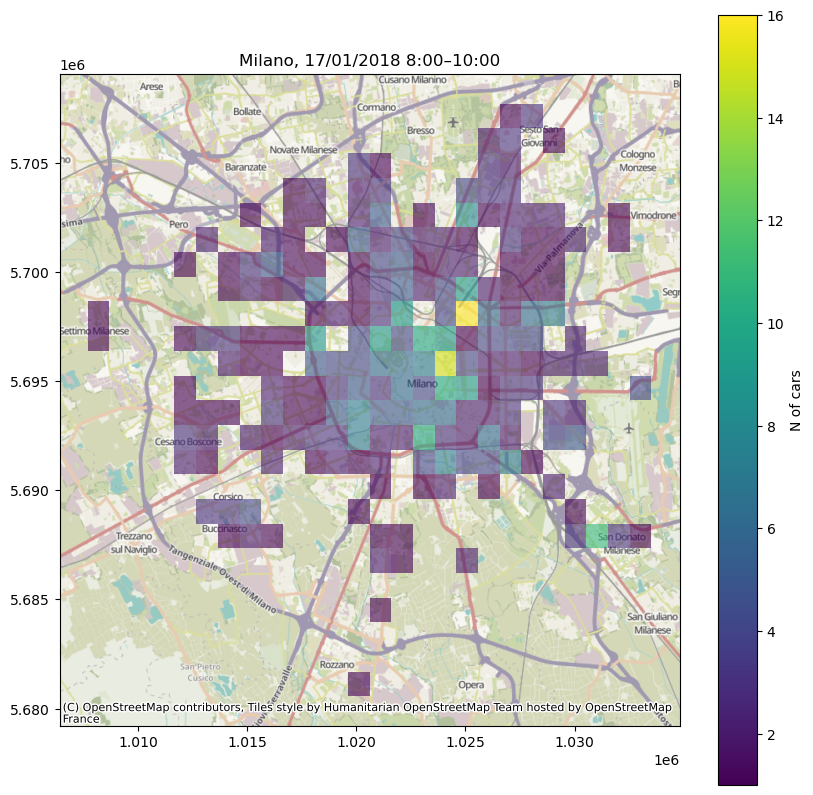

Analyzing enjoy data for Milano on 17/01/2018 18:00–20:00


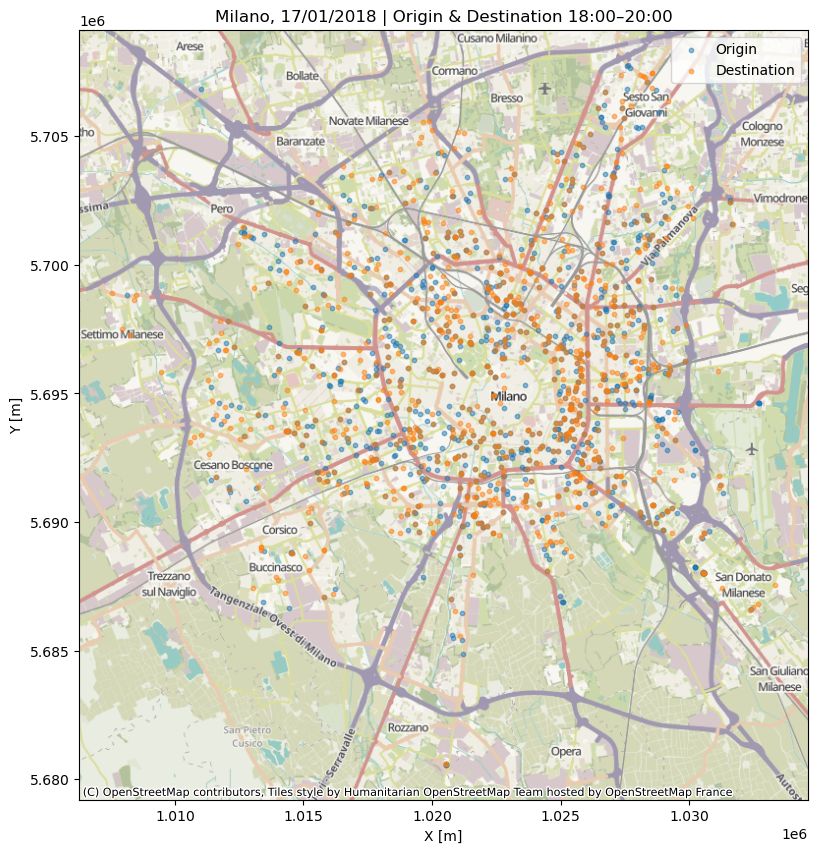

In [ ]:
# -*- coding: utf-8 -*-
# Milano OD/Density — robust, no IndexError (indices are clipped to valid range)

import pymongo as pm
from datetime import datetime
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
import contextily as cx
from shapely.geometry import Polygon
import numpy as np
import matplotlib.pyplot as plt

# ---------------- Config ----------------
SERVICE = "enjoy"              # برای Milano
EPSG_WM = 3857
# اندازه گرید
N_COLS_OD, N_ROWS_OD   = 27, 28
N_COLS_DEN, N_ROWS_DEN = 27, 25

# -------------- Helpers --------------
def _make_bins(vmin, vmax, n):
    """ساخت مرزهای سلول‌ها با کمی حاشیه. اگر vmin==vmax بازهٔ کوچک می‌سازد."""
    if pd.isna(vmin) or pd.isna(vmax):
        raise ValueError("Bin bounds are NaN.")
    if vmin == vmax:
        vmin -= 1e-5
        vmax += 1e-5
    return np.linspace(vmin - 1e-5, vmax + 1e-5, num=n)

def _bin_index(values, bins):
    """
    اندیس سلول را می‌دهد:
    - از searchsorted(side='right') استفاده می‌کند
    - سپس با clip بین [1, len(bins)-1] محدود می‌کند
    - خروجی int تضمین می‌شود
    """
    idx = np.searchsorted(bins, values, side='right')
    idx = np.clip(idx, 1, len(bins) - 1).astype(int)
    return idx

def _cell_polygon(cols, rows, c, r):
    """پلی‌گون سلول (r,c) با اندیس‌های معتبر (1..len-1)."""
    return Polygon([
        (cols[c - 1], rows[r - 1]),
        (cols[c],     rows[r - 1]),
        (cols[c],     rows[r]),
        (cols[c - 1], rows[r]),
    ])

def _add_basemap_safely(ax, zoom=12):
    try:
        cx.add_basemap(ax, zoom=zoom)
    except Exception:
        pass  # اگر تایل لود نشد، بدون basemap ادامه بده

# -------------- DB fetch --------------
def fetch_bookings(db, service, city, date, start_hour, end_hour):
    col_name = 'PermanentBookings' if service == 'car2go' else 'enjoy_PermanentBookings'
    Bookings = db[col_name]
    t0 = datetime(date.year, date.month, date.day, start_hour, 0, 0).timestamp()
    t1 = datetime(date.year, date.month, date.day, end_hour,   0, 0).timestamp()

    cur = Bookings.aggregate([
        {'$match': {'city': city, 'init_time': {'$gte': t0, '$lte': t1}}},
        {'$project': {
            'start_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 0]},
            'start_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 1]},
            'end_lon':   {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]},
            'end_lat':   {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 1]},
            'duration':  {'$subtract': ['$final_time', '$init_time']},
            'moved':     {'$ne': [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]}
        }},
        {'$match': {'duration': {'$gte': 300, '$lte': 7200}, 'moved': True}},
        {'$sort': {'_id': 1}}
    ], allowDiskUse=True)

    df = pd.DataFrame(list(cur))
    if df.empty:
        return df
    return df.dropna(subset=['start_lon', 'start_lat', 'end_lon', 'end_lat'])

def fetch_parkings(db, service, city, date, start_hour, end_hour):
    col_name = 'PermanentParkings' if service == 'car2go' else 'enjoy_PermanentParkings'
    Parkings = db[col_name]
    t0 = datetime(date.year, date.month, date.day, start_hour, 0, 0).timestamp()
    t1 = datetime(date.year, date.month, date.day, end_hour,   0, 0).timestamp()

    cur = Parkings.aggregate([
        {'$match': {'city': city, 'init_time': {'$gte': t0, '$lte': t1}}},
        {'$project': {
            'lon': {"$arrayElemAt": ["$loc.coordinates", 0]},
            'lat': {"$arrayElemAt": ["$loc.coordinates", 1]},
            'duration': {'$subtract': ['$final_time', '$init_time']}
        }},
        {'$match': {'duration': {'$gte': 300, '$lte': 86400}}},
        {'$sort': {'_id': 1}}
    ], allowDiskUse=True)

    df = pd.DataFrame(list(cur))
    if df.empty:
        return df
    return df.dropna(subset=['lon', 'lat'])

# -------------- Plots --------------
def plot_OD_with_legend(db, service, city, date, start_hour, end_hour, plot=True, save=True):
    df = fetch_bookings(db, service, city, date, start_hour, end_hour)
    if df.empty:
        print(f"No booking data found for {city} on {date.strftime('%d/%m/%Y')}.")
        return None, None

    origin = GeoDataFrame(df, geometry=gpd.points_from_xy(df['start_lon'], df['start_lat']), crs="EPSG:4326")
    dest   = GeoDataFrame(df, geometry=gpd.points_from_xy(df['end_lon'],  df['end_lat']),  crs="EPSG:4326")

    if plot:
        o_wm = origin.to_crs(epsg=EPSG_WM)
        d_wm = dest.to_crs(epsg=EPSG_WM)
        fig, ax = plt.subplots(figsize=(10, 10))
        o_wm.plot(ax=ax, alpha=0.5, markersize=10, label='Origin')
        d_wm.plot(ax=ax, alpha=0.5, markersize=10, label='Destination')
        plt.legend()
        plt.xlabel('X [m]'); plt.ylabel('Y [m]')
        plt.title(f'{city}, {date.strftime("%d/%m/%Y")} | Origin & Destination {start_hour}:00–{end_hour}:00')
        _add_basemap_safely(ax, zoom=12)
        if save:
            plt.savefig(f'{city}_{date:%Y%m%d}_{start_hour}_{end_hour}_OD_points.jpg', dpi=140, bbox_inches='tight')
        plt.show()
    return origin, dest

def plot_density_grid(db, service, city, date, start_hour, end_hour, plot=True, save=True):
    df = fetch_parkings(db, service, city, date, start_hour, end_hour)
    if df.empty:
        print(f"No parking data found for {city} on {date.strftime('%d/%m/%Y')}.")
        return None

    cols = _make_bins(df['lon'].min(), df['lon'].max(), N_COLS_DEN)
    rows = _make_bins(df['lat'].min(), df['lat'].max(), N_ROWS_DEN)

    df['col'] = _bin_index(df['lon'].to_numpy(), cols)
    df['row'] = _bin_index(df['lat'].to_numpy(), rows)

    res = (df.groupby(['row', 'col']).size()
             .reset_index(name='count')
             .sort_values(['row','col'])
          )
    res['dens'] = res['count'] / res['count'].sum() * 100.0

    # ساخت پلی‌گون هر سلول (اندیس‌ها معتبرند، IndexError نمی‌آید)
    res['geometry'] = [ _cell_polygon(cols, rows, c, r)
                        for r, c in zip(res['row'].to_numpy(), res['col'].to_numpy()) ]
    gdf = GeoDataFrame(res, geometry='geometry', crs="EPSG:4326")

    if plot:
        df_wm = gdf.to_crs(epsg=EPSG_WM)
        ax = df_wm.plot(figsize=(10, 10), column="count", legend=True,
                        legend_kwds={"label": "N of cars"}, alpha=0.6)
        plt.title(f'{city}, {date:%d/%m/%Y} {start_hour}:00–{end_hour}:00')
        _add_basemap_safely(ax, zoom=12)
        if save:
            plt.savefig(f'{city}_{date:%Y%m%d}_{start_hour}_{end_hour}_density.jpg', dpi=140, bbox_inches='tight')
        plt.show()
    return gdf

def plot_OD(db, service, city, date, start_hour, end_hour, plot=False, save=True):
    df = fetch_bookings(db, service, city, date, start_hour, end_hour)
    if df.empty:
        print(f"No booking data for {city} on {date:%d/%m/%Y'}.")
        return None

    # گرید بر اساس کل محدوده مبدا/مقصد
    lon_min = min(df['start_lon'].min(), df['end_lon'].min())
    lon_max = max(df['start_lon'].max(), df['end_lon'].max())
    lat_min = min(df['start_lat'].min(), df['end_lat'].min())
    lat_max = max(df['start_lat'].max(), df['end_lat'].max())

    cols = _make_bins(lon_min, lon_max, N_COLS_OD)
    rows = _make_bins(lat_min, lat_max, N_ROWS_OD)

    # اندیس سلول‌ها (همیشه 1..len-1)
    df['col_start'] = _bin_index(df['start_lon'].to_numpy(), cols)
    df['row_start'] = _bin_index(df['start_lat'].to_numpy(), rows)
    df['col_end']   = _bin_index(df['end_lon'].to_numpy(),   cols)
    df['row_end']   = _bin_index(df['end_lat'].to_numpy(),   rows)

    # شمارش مبدا/مقصد
    start_res = df.groupby(['row_start', 'col_start']).size().reset_index(name='Nstart')
    end_res   = df.groupby(['row_end',   'col_end']).size().reset_index(name='Nend')

    # ادغام روی شبکهٔ مشترک
    res = pd.merge(start_res, end_res,
                   left_on=['row_start','col_start'],
                   right_on=['row_end','col_end'],
                   how='outer')

    # تعیین سلول مرجع (اگر یک طرف نبود، از طرف دیگر)
    res['row_cell'] = res['row_start'].fillna(res['row_end']).astype(int)
    res['col_cell'] = res['col_start'].fillna(res['col_end']).astype(int)

    # محاسبه دلتا
    res['Nstart'] = res['Nstart'].fillna(0).astype(int)
    res['Nend']   = res['Nend'].fillna(0).astype(int)
    res['delta']  = res['Nend'] - res['Nstart']

    # اندیس‌ها را دوباره با clip معتبر کن (محکم‌کاری)
    res['row_cell'] = np.clip(res['row_cell'], 1, len(rows)-1).astype(int)
    res['col_cell'] = np.clip(res['col_cell'], 1, len(cols)-1).astype(int)

    # ساخت هندسه — با اندیس‌های معتبر، IndexError غیرممکن است
    res['geometry'] = [ _cell_polygon(cols, rows, c, r)
                        for r, c in zip(res['row_cell'].to_numpy(), res['col_cell'].to_numpy()) ]

    gdf = GeoDataFrame(res[['row_cell','col_cell','Nstart','Nend','delta','geometry']],
                       geometry='geometry', crs="EPSG:4326")

    if plot:
        df_wm = gdf.to_crs(epsg=EPSG_WM)
        ax = df_wm.plot(figsize=(10, 10), column="delta", legend=True,
                        legend_kwds={"label": "Δ departures - arrivals"}, alpha=0.6)
        plt.title(f'{city}, {date:%d/%m/%Y} {start_hour}:00–{end_hour}:00')
        _add_basemap_safely(ax, zoom=12)
        if save:
            plt.savefig(f'{city}_{date:%Y%m%d}_{start_hour}_{end_hour}_OD_delta.jpg', dpi=140, bbox_inches='tight')
        plt.show()
    return gdf

# ---------------- Main ----------------
if __name__ == "__main__":
    # اتصال دیتابیس (در نوت‌بوک اگر db ساختی، همین استفاده می‌شود)
    # client = pm.MongoClient("mongodb://bigdatadb.polito.it:27017/")
    # db = client["carsharing"]

    db = globals().get('db', None)
    if db is None:
        print("db is not defined. Create the Mongo client and db before running the loop.")
    else:
        cities_names = ["Milano"]
        dates = [datetime(2018, 1, 15), datetime(2018, 1, 16), datetime(2018, 1, 17), datetime(2018, 1, 21)]
        hours = [(8, 10), (18, 20)]

        for date in dates:
            for start_hour, end_hour in hours:
                for city in cities_names:
                    print(f"Analyzing {SERVICE} data for {city} on {date:%d/%m/%Y} {start_hour}:00–{end_hour}:00")
                    plot_OD_with_legend(db, SERVICE, city, date, start_hour, end_hour, plot=True, save=True)
                    plot_density_grid(db, SERVICE, city, date, start_hour, end_hour, plot=True, save=True)
                    plot_OD(db, SERVICE, city, date, start_hour, end_hour, plot=False, save=True)
